In [2]:
import os
import scipy.io
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
from scipy.stats import pearsonr
from scipy.io import savemat
from utils import daily_blocks, extract_all_licks
from sklearn.cluster import KMeans
from utils import daily_blocks, block_stim_evoke_response


outcome_list = ['Hit', 'Miss', 'FA', 'CR']
mouse_names = ['jl009', 'fz017', 'fz009', 'fz006']
data_paths = ["Z:/Jenni/jl009/jl009behavimaging.mat",
             "W:/Jenni/fz017/fz017behavimaging.mat",
             "Y:/Jenni/fz009/fz009_behavimaging.mat",
             "Y:/sarah/fz006/behavimaging.mat"]
disks = ['Z', 'W', 'Y', 'Y']

In [58]:
from utils import daily_blocks, block_stim_evoke_response


In [ ]:
mouse_id = 3
mouse_name = mouse_names[mouse_id]
disk = disks[mouse_id]

data_path = data_paths[mouse_id]
mat = scipy.io.loadmat(data_path)
data = mat['behavimaging']
nBlocks = data.shape[-1]

In [70]:
day = 1
iblocks = daily_blocks(data, day)
daily_spks = []
daily_behav = []
for i in iblocks:
    block = data[0, i]
    behavior = block['behavdata']
    raw_spks = block['imagingdata']
    NN, NT = raw_spks.shape
    print(raw_spks.shape)
    daily_spks.append(raw_spks)
    daily_behav.append(behavior)

(447, 11757)
(447, 11357)
(447, 12697)


In [71]:
daily_spks = np.hstack(daily_spks)
print('day {} spk shape: {}'.format(day, daily_spks.shape))

daily_behav = np.hstack(daily_behav)
print('day {} behavior shape: {}'.format(day, daily_behav.shape))

from scipy.stats import zscore
norm_spks = zscore(daily_spks, axis=1)

day 1 spk shape: (447, 35811)
day 1 behavior shape: (4, 35811)


# cluster by all spks (first day)

## tsne

In [ ]:
from sklearn import manifold
tsne = manifold.TSNE(n_components=2, init="pca", random_state=0)
Y = tsne.fit_transform(daily_spks)
print(Y.shape)

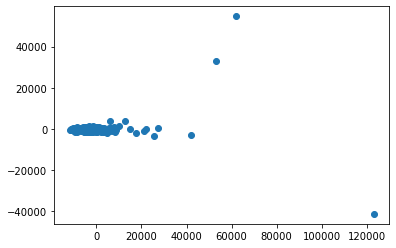

In [7]:
plt.scatter(Y[:, 0], Y[:, 1])

e:\kishorelab\env\fengtong\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
e:\kishorelab\env\fengtong\lib\site-packages\sklearn\manifold\_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


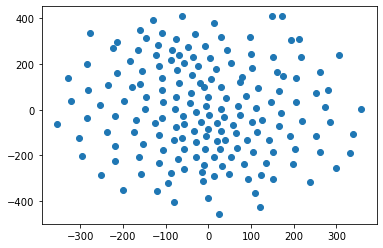

In [52]:
tsne = manifold.TSNE(n_components=2, init="pca", random_state=0)
Y = tsne.fit_transform(norm_spks)
plt.scatter(Y[:, 0], Y[:, 1])

## rastermap

In [79]:
# rastermap
# import sys
# sys.path.insert(0, 'C:/Users/fdu5/Desktop/rastermap')
from rastermap.mapping import Rastermap
model = Rastermap(n_X=20)
model.fit(norm_spks)

nmin 200
0.04801154136657715
3.3560636043548584
3.5078585147857666
3.5078585147857666
(360, 400)
(50,)
1.0
time; iteration;  explained PC variance
0.03s     0        0.0350      8
0.27s    10        0.1524      24
0.50s    20        0.2686      80
0.77s    30        0.6154      360
1.03s    40        0.6168      360
1.28s   final      0.6173
5.95s upsampled    0.6173


In [98]:
from rastermap.mapping import Rastermap
model = Rastermap(n_X=20)
model.fit(norm_spks)
print(model.embedding.shape)

(447, 2)


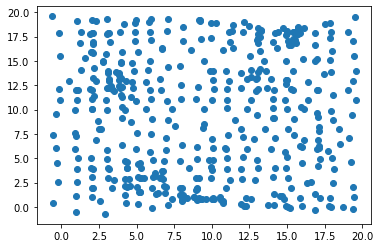

In [80]:
plt.scatter(model.embedding[:, 0], model.embedding[:, 1])

In [ ]:
# fit_transform returns embedding (upsampled cluster identities)
# embedding = model.fit_transform(daily_spks)

In [81]:
kmeans = KMeans(n_clusters=4, random_state=0).fit(model.embedding)

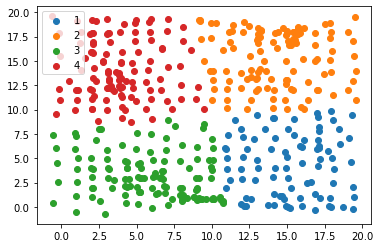

In [82]:
X = model.embedding
for i in range(4):
    idx = np.where(kmeans.labels_ == i)[0]
    plt.scatter(X[idx, 0], X[idx, 1], label='%d'%(i+1))
plt.legend()
plt.show()

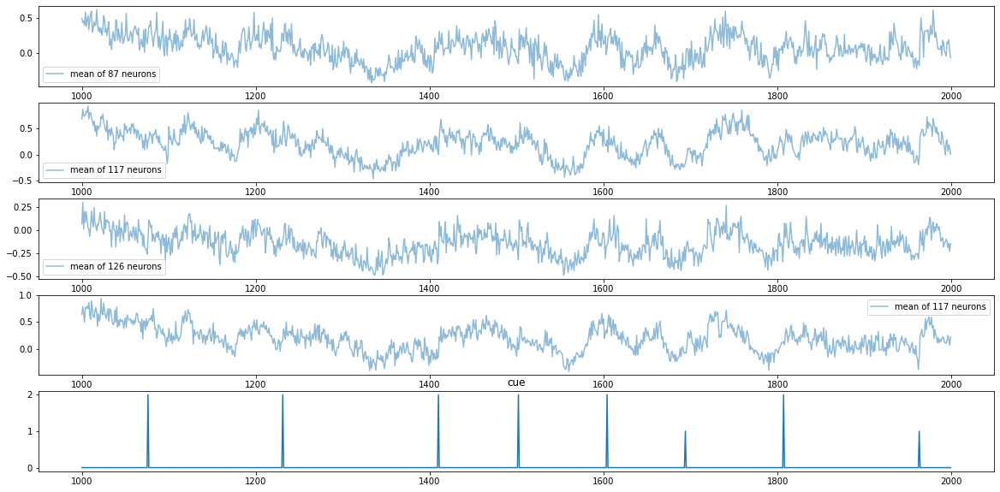

In [83]:
plt.figure(figsize=(20, 10))
K = 4
for i in range(K):
    plt.subplot(K+1, 1, i+1)
    idx = np.where(kmeans.labels_ == i)[0]
    plt.plot(np.arange(1000, 2000), np.mean(norm_spks[idx, 1000:2000], axis=0), label='mean of {} neurons'.format(len(idx)), alpha=0.5)
    plt.legend()


plt.subplot(K+1, 1, K+1)
plt.plot(np.arange(1000, 2000), daily_behav[0, 1000:2000])
plt.title('cue')
plt.show()

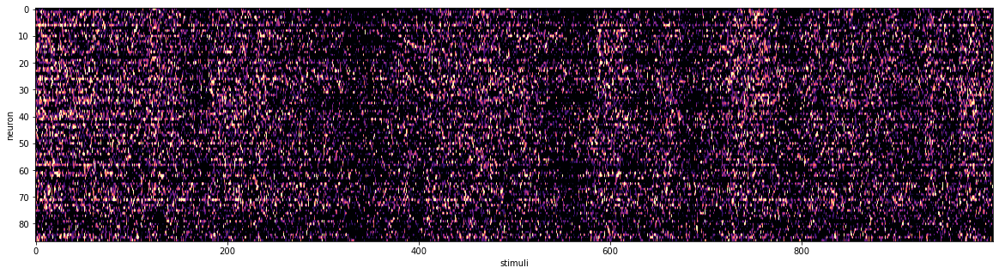

In [86]:
plt.figure(figsize=(20,5))
idx = np.where(kmeans.labels_ == 0)[0]
plt.imshow(zscore(norm_spks[idx], axis=1)[:,1000:2000], aspect='auto', vmin=0, vmax=2, cmap='magma')
plt.xlabel('stimuli')
plt.ylabel('neuron')
plt.show()

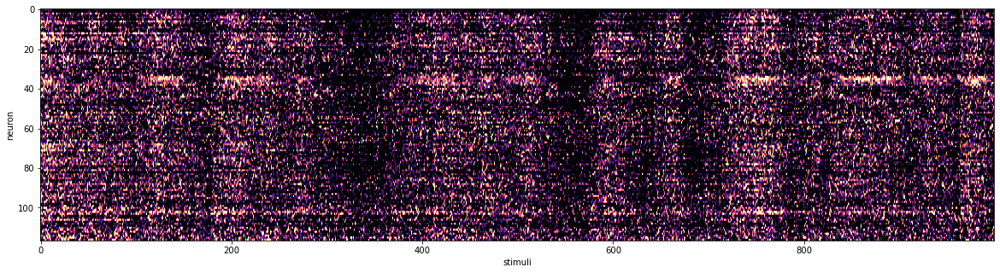

In [88]:
plt.figure(figsize=(20,5))
idx = np.where(kmeans.labels_ == 1)[0]
plt.imshow(zscore(norm_spks[idx], axis=1)[:,1000:2000], aspect='auto', vmin=0, vmax=2, cmap='magma')
plt.xlabel('stimuli')
plt.ylabel('neuron')
plt.show()

In [89]:
rcm = RCM(norm_spks[model.isort])

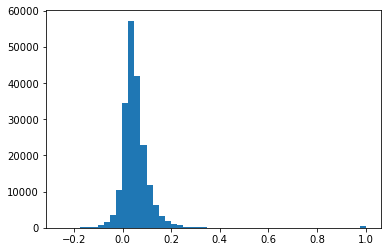

In [90]:
plt.hist(rcm.reshape(-1), bins=50)
plt.show()

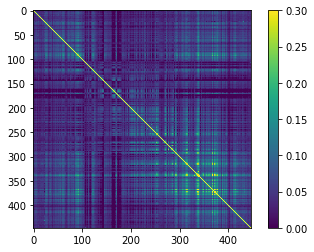

In [91]:
plt.imshow(rcm, vmin=0, vmax=0.3)
plt.colorbar()

### cluster analysis

day 1 spk shape: (300, 117, 75)
day 1 behavior shape: (300,)
day 1 alllick shape: (300, 75)


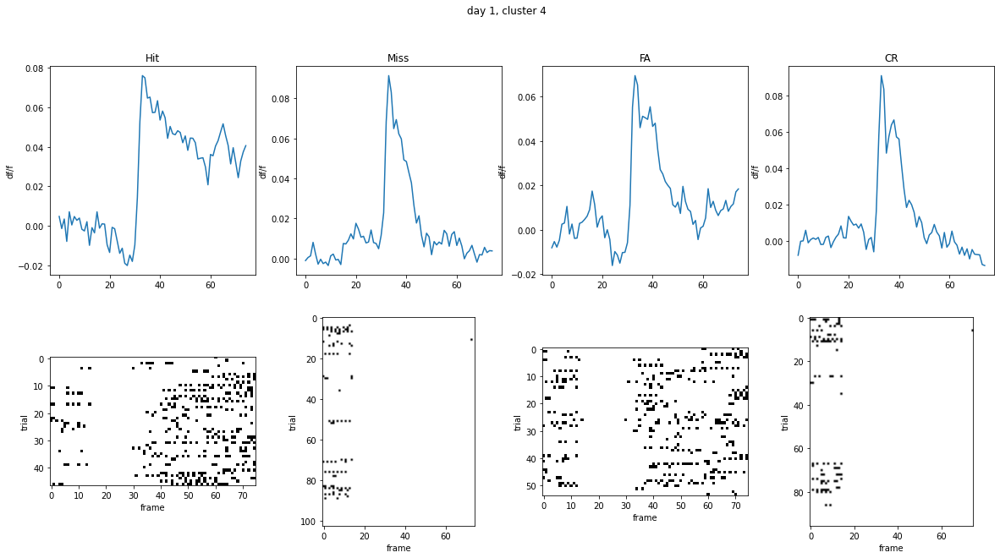

In [97]:
# stim evoke response of cluster 1 VS 2
c_id = 4 # cluster id
day = 1
plt.figure(figsize=(20, 10))
iblocks = daily_blocks(data, day)
daily_cues = []
daily_outcomes = []
daily_responses = []
daily_firstlicks = []
daily_alllicks = []
for i in iblocks:
    block = data[0, i]
    # normalize doesn't have much effect on the result, so set it to False
    cues, outcomes, firstlicks, stim_resp, alllicks = block_stim_evoke_response(block, normalize=False)
    daily_cues.append(cues)
    daily_outcomes.append(outcomes)
    daily_responses.append(stim_resp)
    daily_firstlicks.append(firstlicks)
    daily_alllicks.append(alllicks)

daily_cues = np.hstack(daily_cues)
daily_outcomes = np.hstack(daily_outcomes)
daily_responses = np.vstack(daily_responses)
daily_firstlicks = np.hstack(daily_firstlicks)
daily_alllicks = np.vstack(daily_alllicks)

idx = np.where(kmeans.labels_ == (c_id-1))[0]
daily_responses = daily_responses[:, idx, :]
NN = daily_responses.shape[1]

print('day {} spk shape: {}'.format(day, daily_responses.shape))
print('day {} behavior shape: {}'.format(day, daily_outcomes.shape))
print('day {} alllick shape: {}'.format(day, daily_alllicks.shape))


# from scipy.stats import pearsonr
daily_spks = daily_responses.transpose(1, 0, 2)
daily_spks = daily_spks.reshape(NN, -1)
avg_resp = np.mean(daily_spks, axis=0) # ntrials x 75
corr = np.zeros(NN)
for i in range(NN):
    corr[i] = pearsonr(avg_resp, daily_spks[i])[0]
isort = np.argsort(corr)
for outcome_index in range(1,5):
    # hit responses
    ioutcome = np.where(daily_outcomes == outcome_index)[0]
    resp = daily_responses[ioutcome]
    lick = daily_alllicks[ioutcome]
    cue = daily_cues[i]
    NT = resp.shape[-1]
    resp = resp.reshape(-1, NT)
    resp = np.mean(resp, axis=0)
    flick = np.zeros(NT)
    plt.subplot(2,4,outcome_index)
    x = np.arange(NT)
    plt.plot(x, resp)
    plt.title(outcome_list[outcome_index-1])
    plt.ylabel('df/f')
    plt.subplot(2,4,4+outcome_index)
    plt.imshow(lick, cmap='binary')
    plt.xlabel('frame')
    plt.ylabel('trial')
plt.suptitle('day {}, cluster {}'.format(day, c_id))
plt.show()
# fig_save_path = os.path.join('figures', 'avg_stim-evoke-response_{}_day-{}'.format(mouse_name, day))
# plt.savefig(fig_save_path)
# plt.close()

## rastermap(zscore)

In [ ]:
from rastermap.mapping import Rastermap
model = Rastermap(n_X=20)
model.fit(norm_spks)

## kmeans

In [6]:
kmeans = KMeans(n_clusters=2, random_state=0).fit(daily_spks)
print(kmeans.labels_.shape)

(175,)


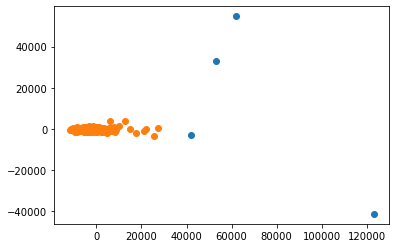

In [19]:
idx1 = np.where(kmeans.labels_==0)
plt.scatter(Y[idx1, 0], Y[idx1, 1])
idx2 = np.where(kmeans.labels_==1)
plt.scatter(Y[idx2, 0], Y[idx2, 1])

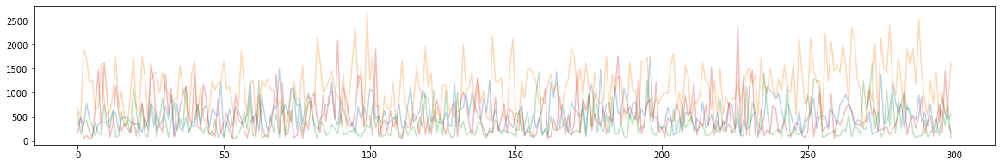

In [25]:
plt.figure(figsize=(20, 3))
for i in idx1[0]:
    plt.plot(np.arange(0, 300), daily_spks[i, :300], alpha=0.3)

In [31]:
a = np.mean(daily_spks[idx1, :300], axis=0)
print(a.shape, daily_spks[idx1, :300].shape)

(4, 300) (1, 4, 300)


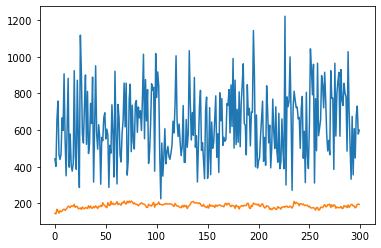

In [33]:
plt.plot(np.arange(0, 300), np.mean(daily_spks[idx1[0], :300], axis=0), label='mean of {} neurons'.format(len(idx1[0])))
plt.plot(np.arange(0, 300), np.mean(daily_spks[idx2[0], :300], axis=0), label='mean of {} neurons'.format(len(idx2[0])))

In [35]:
avg_spks = np.mean(daily_spks, axis=1) # avg response of each axon

(array([ 5., 21., 15., 27., 33., 24., 19.,  6.,  9.,  4.,  1.,  1.,  2.,
         0.,  2.,  1.,  0.,  1.,  0.,  0.,  0.,  0.,  1.,  0.,  0.,  0.,
         0.,  0.,  1.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.]),
 array([108.86737, 121.39196, 133.91655, 146.44115, 158.96574, 171.49033,
        184.01492, 196.53952, 209.0641 , 221.5887 , 234.1133 , 246.63788,
        259.16248, 271.68707, 284.21167, 296.73627, 309.26083, 321.78543,
        334.31003, 346.83463, 359.35922, 371.88382, 384.4084 , 396.93298,
        409.45758, 421.98218, 434.50677, 447.03137, 459.55597, 472.08054,
        484.60513, 497.12973, 509.65433, 522.1789 , 534.7035 , 547.2281 ,
        559.7527 , 572.2773 , 584.8019 , 597.3265 , 609.8511 , 622.3757 ,
        634.90027, 647.42487, 659.9494 , 672.474  , 684.9986 , 697.5232 ,
        710.0478 , 722.5724 , 735.097  ], dtype=float32),
 <BarContainer object of 50 artists>)

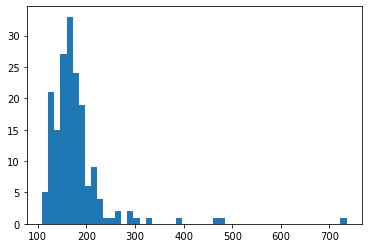

In [36]:
plt.hist(avg_spks, bins=50)

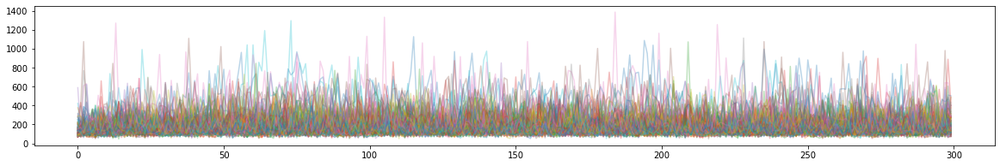

### zscore

In [14]:
K = 5
kmeans = KMeans(n_clusters=K, random_state=0).fit(norm_spks)

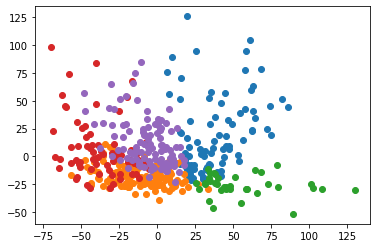

In [15]:
for i in range(K):
    idx = np.where(kmeans.labels_ == i)[0]
    plt.scatter(X[idx, 0], X[idx, 1])
plt.show()

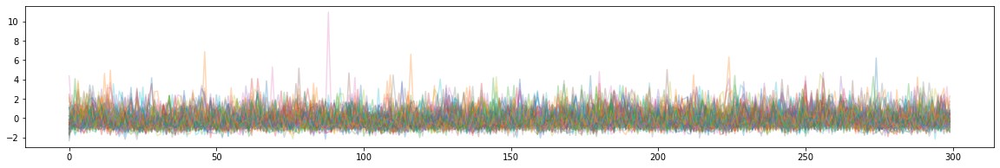

In [16]:
plt.figure(figsize=(20, 3))
idx = np.where(kmeans.labels_ == 0)[0]
for i in idx:
    plt.plot(np.arange(0, 300), norm_spks[i, :300], alpha=0.3)

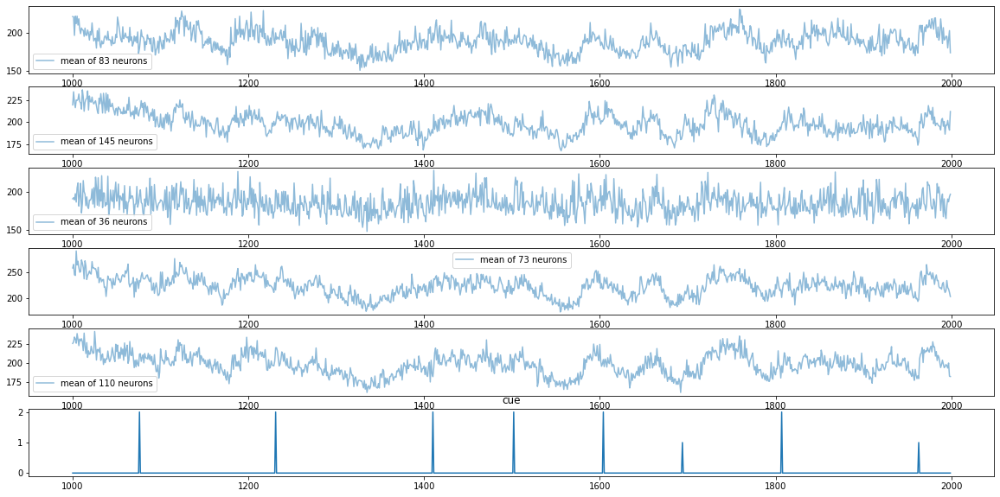

In [17]:
plt.figure(figsize=(20, 10))

for i in range(K):
    plt.subplot(K+1, 1, i+1)
    idx = np.where(kmeans.labels_ == i)[0]
    plt.plot(np.arange(1000, 2000), np.mean(daily_spks[idx, 1000:2000], axis=0), label='mean of {} neurons'.format(len(idx)), alpha=0.5)
    plt.legend()


plt.subplot(K+1, 1, K+1)
plt.plot(np.arange(1000, 2000), daily_behav[0, 1000:2000])
plt.title('cue')
plt.show()

In [72]:
trange = np.arange(1000, 2000)
idxes = []
for i in [1,2,4]:
    idx = np.where(kmeans.labels_ == i)[0]
    idxes.append(idx)
non_responsive_idxes = np.hstack(idxes)

idxes = []
for i in [0, 3]:
    idx = np.where(kmeans.labels_ == i)[0]
    idxes.append(idx)
responsive_idxes = np.hstack(idxes)

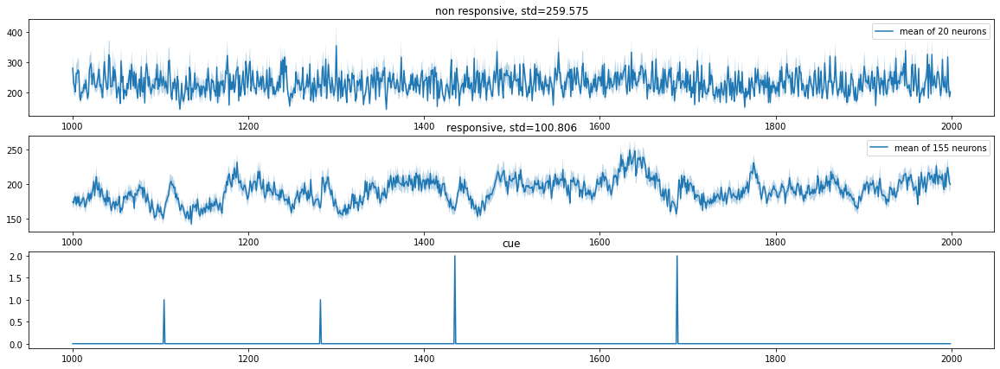

In [87]:
plt.figure(figsize=(20, 7))
plt.subplot(311)
y = np.mean(daily_spks[non_responsive_idxes, 1000:2000], axis=0)
std = np.std(daily_spks[non_responsive_idxes, 1000:2000], axis=0)
error = std/10
plt.plot(trange, np.mean(daily_spks[non_responsive_idxes, 1000:2000], axis=0), label='mean of {} neurons'.format(len(non_responsive_idxes)))
plt.fill_between(trange, y-error, y+error, alpha=0.3)
plt.title('non responsive, std={:.3f}'.format(np.mean(std)))
plt.legend()
plt.subplot(312)
y = np.mean(daily_spks[responsive_idxes, 1000:2000], axis=0)
std = np.std(daily_spks[responsive_idxes, 1000:2000], axis=0)
error = std/10
plt.plot(trange, np.mean(daily_spks[responsive_idxes, 1000:2000], axis=0), label='mean of {} neurons'.format(len(responsive_idxes)))
plt.fill_between(trange, y-error, y+error, alpha=0.3)
plt.title('responsive, std={:.3f}'.format(np.mean(std)))
plt.legend()
plt.subplot(313)
plt.plot(trange, daily_behav[0, 1000:2000])
plt.title('cue')
plt.show()

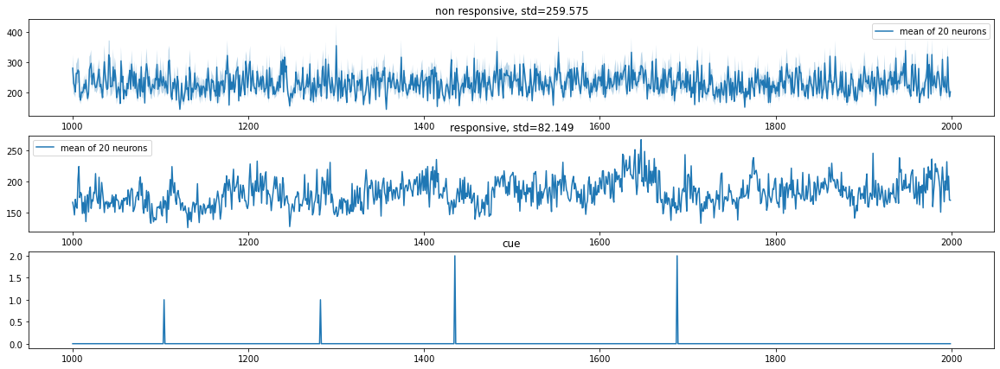

In [89]:
plt.figure(figsize=(20, 7))
plt.subplot(311)
y = np.mean(daily_spks[non_responsive_idxes, 1000:2000], axis=0)
std = np.std(daily_spks[non_responsive_idxes, 1000:2000], axis=0)
error = std/10
plt.plot(trange, np.mean(daily_spks[non_responsive_idxes, 1000:2000], axis=0), label='mean of {} neurons'.format(len(non_responsive_idxes)))
plt.fill_between(trange, y-error, y+error, alpha=0.3)
plt.title('non responsive, std={:.3f}'.format(np.mean(std)))
plt.legend()
plt.subplot(312)
np.random.seed(0)
irand = np.random.choice(responsive_idxes, size=len(non_responsive_idxes), replace=False)
y = np.mean(daily_spks[irand, 1000:2000], axis=0)
std = np.std(daily_spks[irand, 1000:2000], axis=0)
error = std/10
plt.plot(trange, np.mean(daily_spks[irand, 1000:2000], axis=0), label='mean of {} neurons'.format(len(irand)))
plt.title('responsive, std={:.3f}'.format(np.mean(std)))
plt.legend()
plt.subplot(313)
plt.plot(trange, daily_behav[0, 1000:2000])
plt.title('cue')
plt.show()

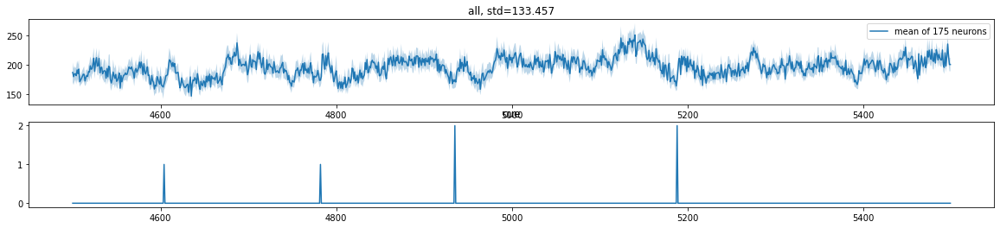

In [173]:
plt.figure(figsize=(20, 4))
plt.subplot(211)
y = np.mean(daily_spks[:, 1000:2000], axis=0)
std = np.std(daily_spks[:, 1000:2000], axis=0)
error = std/10
plt.plot(trange, np.mean(daily_spks[:, 1000:2000], axis=0), label='mean of {} neurons'.format(len(daily_spks)))
plt.fill_between(trange, y-error, y+error, alpha=0.3)
plt.title('all, std={:.3f}'.format(np.mean(std)))
plt.legend()
plt.subplot(212)
plt.plot(trange, daily_behav[0, 1000:2000])
plt.title('cue')
plt.show()

In [93]:
from scipy.stats import pearsonr
avg_resp = np.mean(daily_spks, axis=0)
corr = np.zeros(NN)
for i in range(NN):
    corr[i] = pearsonr(avg_resp, daily_spks[i])[0]

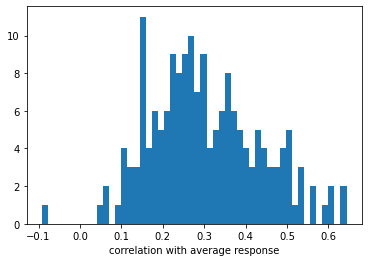

In [95]:
plt.hist(corr, bins=50)
plt.xlabel('correlation with average response')
plt.show()

In [98]:
print(norm_spks.shape)

(175, 34954)


## rastermaps

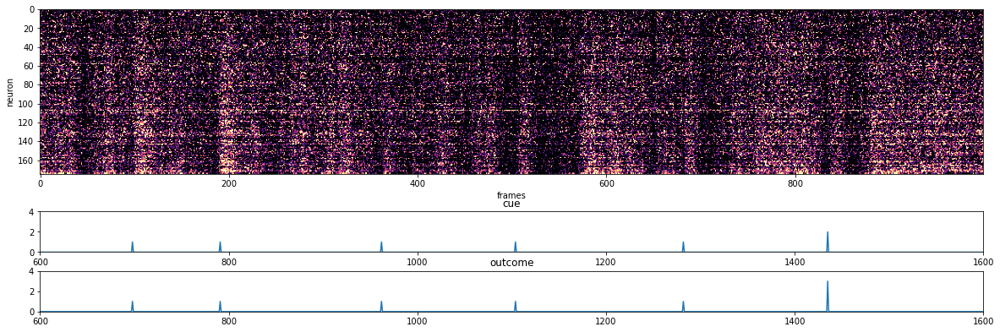

In [122]:
tmin = 600
tmax = 1600
trange = np.arange(tmin, tmax)
isort = np.argsort(corr)
f, (a0, a1, a2) = plt.subplots(3, 1, gridspec_kw={'height_ratios': [5, 1, 1]}, figsize=(20,7))
a0.imshow(norm_spks[np.ix_(isort, trange)], vmin=0, vmax=2, cmap='magma')
# plt.imshow(zscore(model.X_embedding, axis=1)[:,:400], aspect='auto', vmin=0, vmax=2, cmap='magma')
a0.set_xlabel('frames')
a0.set_ylabel('neuron')
# plt.colorbar()
a1.plot(trange, daily_behav[0, trange])
a1.set_xlim([tmin, tmax])
a1.set_title('cue')
a1.set_ylim([0, 4])
# a1.set_ylabel(' ')
# plt.tight_layout()
a2.plot(trange, daily_behav[1, trange])
a2.set_xlim([tmin, tmax])
a2.set_title('outcome')
a2.set_ylim([0, 4])
plt.show()
# - dim1: tone onset + tone id 1 target reinf, 2 foil reinf, 3 target probe, 4 foil probe
# - dim2: outcome
#     - hit 1; miss 2; false alarm 3; correct rejection 4

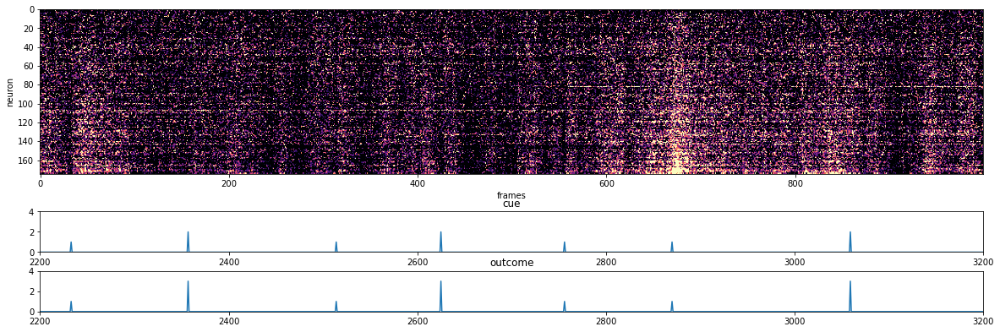

In [123]:
tmin = 2200
tmax = 3200
trange = np.arange(tmin, tmax)
isort = np.argsort(corr)
f, (a0, a1, a2) = plt.subplots(3, 1, gridspec_kw={'height_ratios': [5, 1, 1]}, figsize=(20,7))
a0.imshow(norm_spks[np.ix_(isort, trange)], vmin=0, vmax=2, cmap='magma')
a0.set_xlabel('frames')
a0.set_ylabel('neuron')
# plt.colorbar()
a1.plot(trange, daily_behav[0, trange])
a1.set_xlim([tmin, tmax])
a1.set_ylim([0, 4])
a1.set_title('cue')
a2.plot(trange, daily_behav[1, trange])
a2.set_xlim([tmin, tmax])
a2.set_title('outcome')
a2.set_ylim([0, 4])
plt.show()

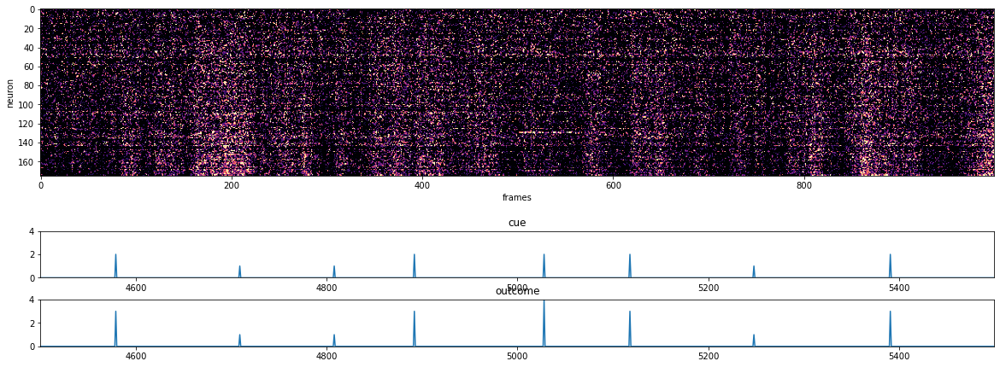

In [124]:
tmin = 4500
tmax = 5500
trange = np.arange(tmin, tmax)
isort = np.argsort(corr)
f, (a0, a1, a2) = plt.subplots(3, 1, gridspec_kw={'height_ratios': [5, 1, 1]}, figsize=(20,8))
a0.imshow(norm_spks[np.ix_(isort, trange)], vmin=0, vmax=2, cmap='magma')
a0.set_xlabel('frames')
a0.set_ylabel('neuron')
# plt.colorbar()
a1.plot(trange, daily_behav[0, trange])
a1.set_xlim([tmin, tmax])
a1.set_ylim([0, 4])
a1.set_title('cue')
a2.plot(trange, daily_behav[1, trange])
a2.set_xlim([tmin, tmax])
a2.set_title('outcome')
a2.set_ylim([0, 4])
plt.show()

## sort by 1d pca

In [37]:
pca = PCA(n_components=1)
pca.fit(daily_spks)

PCA(n_components=1)

In [39]:
embedding = pca.transform(daily_spks).reshape(-1)
print(embedding.shape)

(175,)


In [40]:
isort = np.argsort(embedding)

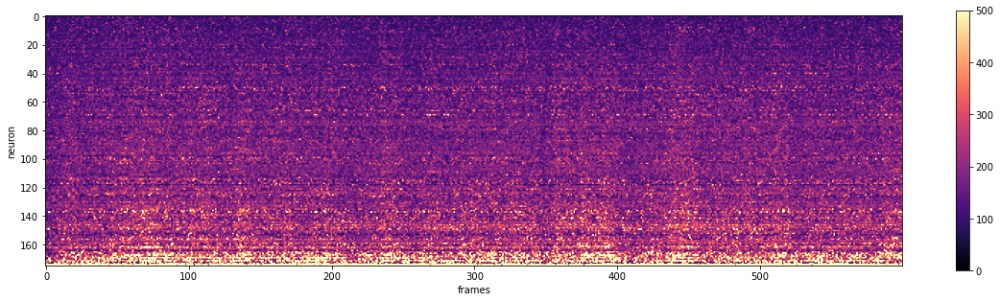

In [44]:
plt.figure(figsize=(20,5))
plt.imshow(daily_spks[isort, :600], vmin=0, vmax=500, cmap='magma')
# plt.imshow(zscore(model.X_embedding, axis=1)[:,:400], aspect='auto', vmin=0, vmax=2, cmap='magma')
plt.xlabel('frames')
plt.ylabel('neuron')
plt.colorbar()
plt.show()

In [18]:
pca = PCA(n_components=1)
pca.fit(norm_spks)
embedding = pca.transform(norm_spks).reshape(-1)
isort = np.argsort(embedding)

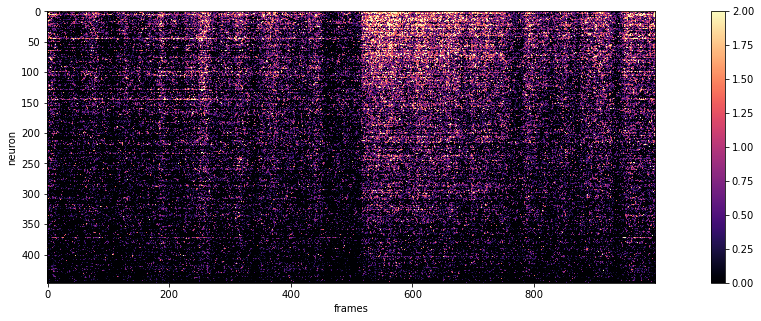

In [20]:
plt.figure(figsize=(20,5))
plt.imshow(norm_spks[isort, :1000], vmin=0, vmax=2, cmap='magma')
# plt.imshow(zscore(model.X_embedding, axis=1)[:,:400], aspect='auto', vmin=0, vmax=2, cmap='magma')
plt.xlabel('frames')
plt.ylabel('neuron')
plt.colorbar()
plt.show()

In [27]:
print(isort.shape)

(447,)


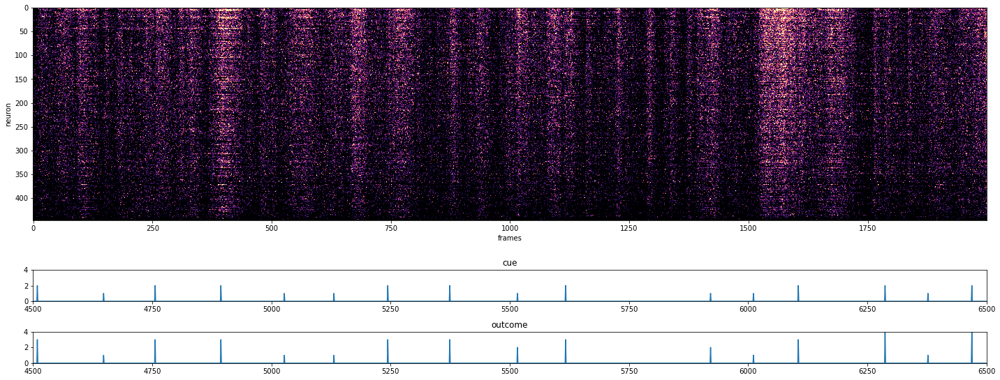

In [24]:
tmin = 4500
tmax = 6500
trange = np.arange(tmin, tmax)
f, (a0, a1, a2) = plt.subplots(3, 1, gridspec_kw={'height_ratios': [8, 1, 1]}, figsize=(20,8))
a0.imshow(norm_spks[np.ix_(isort, trange)], vmin=0, vmax=2, cmap='magma')
a0.set_xlabel('frames')
a0.set_ylabel('neuron')
# plt.colorbar()
a1.plot(trange, daily_behav[0, trange])
a1.set_xlim([tmin, tmax])
a1.set_ylim([0, 4])
a1.set_title('cue')
a2.plot(trange, daily_behav[1, trange])
a2.set_xlim([tmin, tmax])
a2.set_title('outcome')
a2.set_ylim([0, 4])
plt.tight_layout()
plt.show()

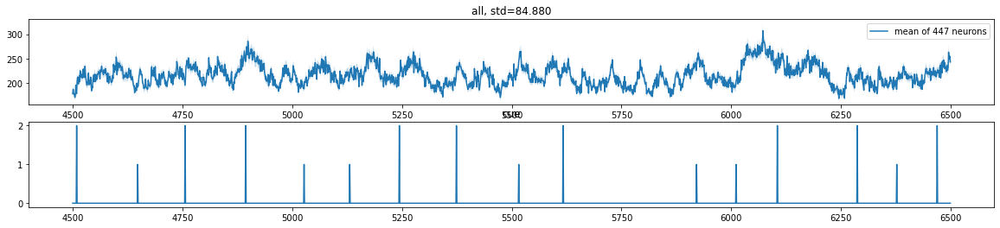

In [28]:
plt.figure(figsize=(20, 4))
plt.subplot(211)
plot_spks = daily_spks[isort[:100]]
y = np.mean(plot_spks[:, trange], axis=0)
std = np.std(plot_spks[:, trange], axis=0)
error = std/10
plt.plot(trange, np.mean(plot_spks[:, trange], axis=0), label='mean of {} neurons'.format(len(daily_spks)))
plt.fill_between(trange, y-error, y+error, alpha=0.3)
plt.title('all, std={:.3f}'.format(np.mean(std)))
plt.legend()
plt.subplot(212)
plt.plot(trange, daily_behav[0, trange])
plt.title('cue')
plt.show()

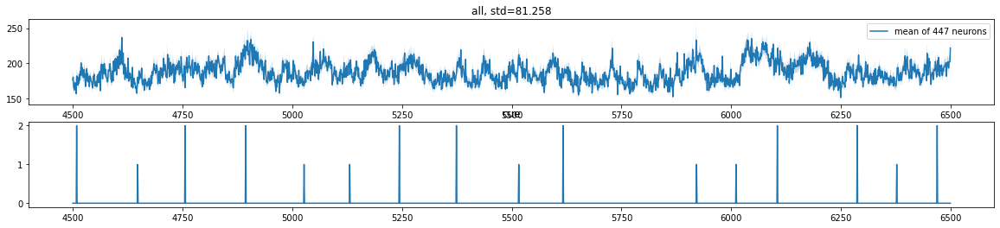

In [29]:
plt.figure(figsize=(20, 4))
plt.subplot(211)
plot_spks = daily_spks[isort[-100:]]
y = np.mean(plot_spks[:, trange], axis=0)
std = np.std(plot_spks[:, trange], axis=0)
error = std/10
plt.plot(trange, np.mean(plot_spks[:, trange], axis=0), label='mean of {} neurons'.format(len(daily_spks)))
plt.fill_between(trange, y-error, y+error, alpha=0.3)
plt.title('all, std={:.3f}'.format(np.mean(std)))
plt.legend()
plt.subplot(212)
plt.plot(trange, daily_behav[0, trange])
plt.title('cue')
plt.show()

## RCM

In [43]:
import scipy.stats as ss
def RCM(features):
    '''
    Compute Representational Correlation Matrix given the features
    :param features: an array of features, should be (N,D), N features with dimension D.
    :return: (N,N) distance matrix
    '''
    z = ss.zscore(features, axis=1)
    D = features.shape[-1]
    corrs = np.matmul(z, z.T) / D
    return corrs

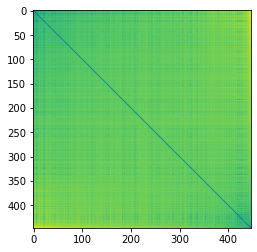

In [33]:
rdm = RDM(norm_spks[isort])
plt.imshow(rdm)

# stim evoke resposne

## first day responses

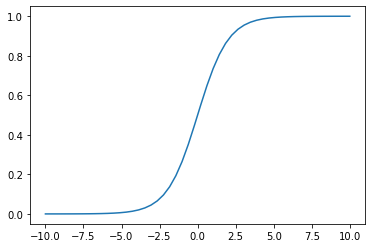

In [190]:
def sigmoid(x):
  return 1 / (1 + np.exp(-x))

x = np.linspace(-10,10,50)
plt.plot(x, sigmoid(x))

In [11]:
day = 1
iblocks = daily_blocks(data, day)
daily_cues = []
daily_outcomes = []
daily_responses = []
daily_firstlicks = []
daily_alllicks = []
for i in iblocks:
    block = data[0, i]
    cues, outcomes, firstlicks, fistim_resp, alllicks = block_stim_evoke_response(block, normalize=False)
    daily_cues.append(cues)
    daily_outcomes.append(outcomes)
    daily_responses.append(stim_resp)
    daily_firstlicks.append(firstlicks)
    daily_alllicks.append(alllicks)

In [12]:
daily_cues = np.hstack(daily_cues)
daily_outcomes = np.hstack(daily_outcomes)
daily_responses = np.vstack(daily_responses)
daily_firstlicks = np.hstack(daily_firstlicks).astype(int)
daily_alllicks = np.vstack(daily_alllicks)

print('day {} spk shape: {}'.format(day, daily_responses.shape))
print('day {} behavior shape: {}'.format(day, daily_outcomes.shape))

day 1 spk shape: (300, 180, 75)
day 1 behavior shape: (300,)


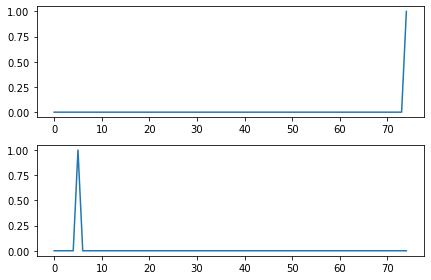

In [80]:
i = 195
x = np.arange(75)
plt.subplot(211)
flicks = np.zeros(x.shape)
flicks[daily_firstlicks[i]] = 1
plt.plot(x, flicks)
plt.subplot(212)
plt.plot(x, daily_alllicks[i])
plt.tight_layout()

In [68]:
irange = np.arange(10, 15)
licks = daily_alllicks[irange]
print(licks.shape)

(5, 75)


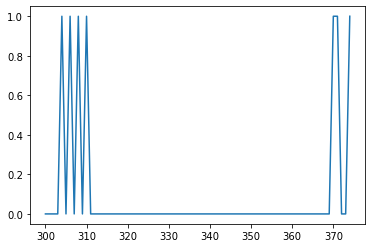

In [69]:
licks = licks.reshape(-1)
x = np.arange(len(licks))
x = np.arange(len(licks)-75, len(licks))
plt.plot(x, licks[x])

### without normalize spks

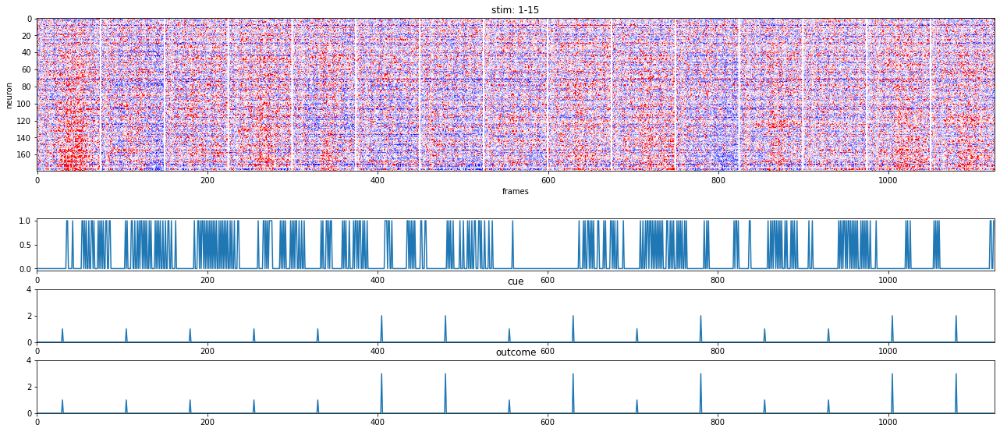

In [16]:
istart = 0
iend = 15
irange = np.arange(istart, iend)
isort = np.argsort(corr)
resp = daily_responses[irange].transpose(1, 0, 2)
resp = resp.reshape(NN, -1)
resp = resp[isort]
licks = daily_alllicks[irange].reshape(-1)
NT = resp.shape[-1]
cue = np.zeros(NT)
out = np.zeros(NT)
for k, v in enumerate(irange):
    cue[30+75*k] = daily_cues[v]
    out[30+75*k] = daily_outcomes[v]
    resp[:, (75*k-1):(75*k+1)] = 0
f, (a0, a1, a2, a3) = plt.subplots(4, 1, gridspec_kw={'height_ratios': [4, 1, 1, 1]}, figsize=(22,10))
im1 = a0.imshow(resp, vmin=-0.5, vmax=0.5, cmap='bwr') # magma
a0.set_xlabel('frames')
a0.set_ylabel('neuron')
# divider = make_axes_locatable(a0)
# cax = divider.append_axes('right', size='5%', pad=0.05)
# f.colorbar(im1, cax=cax, orientation='vertical')
tmin = 0
tmax = NT
x = np.arange(NT)
a1.plot(x, licks)
a1.set_xlim([tmin, tmax])
a2.plot(np.arange(NT), cue)
a2.set_xlim([tmin, tmax])
a2.set_ylim([0, 4])
a2.set_title('cue')
a3.plot(np.arange(NT), out)
a3.set_xlim([tmin, tmax])
a3.set_title('outcome')
a3.set_ylim([0, 4])
a0.set_title('stim: {}-{}'.format(istart+1, iend))
plt.show()

In [19]:
daily_cues = np.hstack(daily_cues)
daily_outcomes = np.hstack(daily_outcomes)
daily_responses = np.vstack(daily_responses)
daily_firstlicks = np.hstack(daily_firstlicks).astype(int)
daily_alllicks = np.vstack(daily_alllicks)

(300, 75)


In [27]:
avg_resp = np.average(daily_responses, axis=1)
print(avg_resp.shape)
avg_resp = avg_resp.reshape(-1)
NT = len(avg_resp)
x = np.arange(NT)

(300, 75)


In [45]:
licks = daily_alllicks.reshape(-1)
firstlick = np.zeros(NT)
firstlick[daily_firstlicks] = 1
print(firstlick.shape)

(22500,)


In [46]:
print(daily_firstlicks.shape)

(300,)


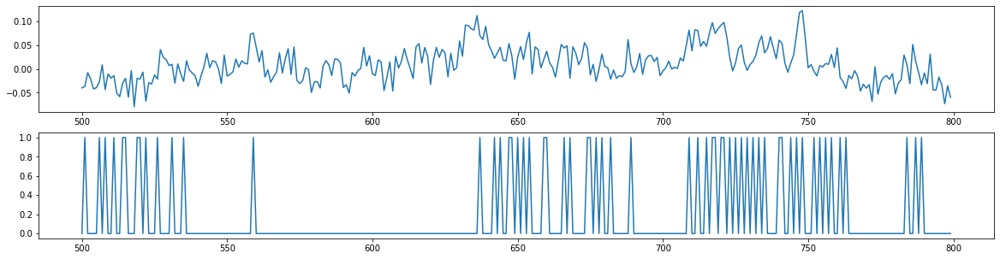

In [48]:
x = np.arange(500, 800)
plt.figure(figsize=(20, 5))
plt.subplot(211)
plt.plot(x, avg_resp[x])
# plt.plot(312)
# plt.plot(x, firstlick[x])
plt.subplot(212)
plt.plot(x, licks[x])

In [77]:
isort = np.argsort(corr)
for i in range(20):
    istart = 15*i
    iend = 15*i+15
    irange = np.arange(istart, iend)
    isort = np.argsort(corr)
    resp = daily_responses[irange].transpose(1, 0, 2)
    resp = resp.reshape(NN, -1)
    resp = resp[isort]
    licks = daily_alllicks[irange].reshape(-1)
    NT = resp.shape[-1]
    cue = np.zeros(NT)
    out = np.zeros(NT)
    flick = np.zeros(NT)
    for k, v in enumerate(irange):
        cue[30+75*k] = daily_cues[v]
        out[30+75*k] = daily_outcomes[v]
        resp[:, (75*k-1):(75*k+1)] = 0
        flick[daily_firstlicks[v]+75*k] = 1
    f, (a0, a1, a2, a3, a4) = plt.subplots(5, 1, gridspec_kw={'height_ratios': [5, 1, 2, 1, 1]}, figsize=(22,12))
    im1 = a0.imshow(resp, vmin=-0.5, vmax=0.5, cmap='bwr') # magma
    a0.set_xlabel('frames')
    a0.set_ylabel('neuron')
    x = np.arange(NT)
    y = resp.mean(axis=0)
    a1.plot(x, licks)
    a1.set_xlim([tmin, tmax])
    a2.plot(x, y)
    idx = np.where(flick>0)[0]
    a2.scatter(x[idx], y[idx], c='red')
    for k, v in enumerate(irange):
        a2.axvline(75*k, alpha=0.2, linestyle='--')
    a2.set_xlim([tmin, tmax])
    a2.set_title('average activity')
    tmin = 0
    tmax = NT
    a3.plot(np.arange(NT), cue)
    a3.set_xlim([tmin, tmax])
    a3.set_ylim([0, 4])
    a3.set_title('cue')
    a4.plot(np.arange(NT), out)
    a4.set_xlim([tmin, tmax])
    a4.set_title('outcome')
    a4.set_ylim([0, 4])
    a0.set_title('stim: {}-{}'.format(istart+1, iend))
    plt.tight_layout()
    fig_save_path = os.path.join('figures', 'stim-evoke-response_{}_day-{}_{}-{}'.format(mouse_name, day, istart+1, iend))
    plt.savefig(fig_save_path)
    plt.close()

### normalize spks

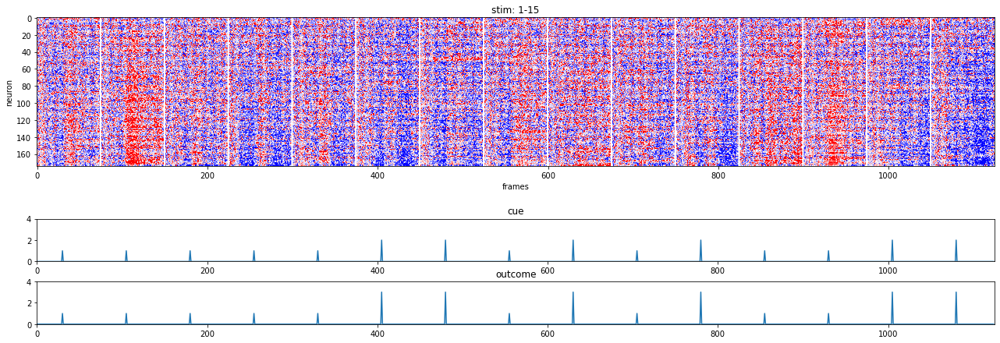

In [199]:
istart = 0
iend = 15
irange = np.arange(istart, iend)
isort = np.argsort(corr)
resp = daily_responses[irange].transpose(1, 0, 2)
resp = resp.reshape(NN, -1)
resp = resp[isort]
NT = resp.shape[-1]
cue = np.zeros(NT)
out = np.zeros(NT)
for k, v in enumerate(irange):
    cue[30+75*k] = daily_cues[v]
    out[30+75*k] = daily_outcomes[v]
    resp[:, (75*k-1):(75*k+1)] = 0
f, (a0, a1, a2) = plt.subplots(3, 1, gridspec_kw={'height_ratios': [5, 1, 1]}, figsize=(22,8))
im1 = a0.imshow(resp, vmin=-0.5, vmax=0.5, cmap='bwr') # magma
a0.set_xlabel('frames')
a0.set_ylabel('neuron')
# divider = make_axes_locatable(a0)
# cax = divider.append_axes('right', size='5%', pad=0.05)
# f.colorbar(im1, cax=cax, orientation='vertical')
tmin = 0
tmax = NT
a1.plot(np.arange(NT), cue)
a1.set_xlim([tmin, tmax])
a1.set_ylim([0, 4])
a1.set_title('cue')
a2.plot(np.arange(NT), out)
a2.set_xlim([tmin, tmax])
a2.set_title('outcome')
a2.set_ylim([0, 4])
a0.set_title('stim: {}-{}'.format(istart+1, iend))
plt.show()

In [210]:
isort = np.argsort(corr)
for i in range(20):
    istart = 15*i
    iend = 15*i+15
    irange = np.arange(istart, iend)
    isort = np.argsort(corr)
    resp = daily_responses[irange].transpose(1, 0, 2)
    resp = resp.reshape(NN, -1)
    resp = resp[isort]
    NT = resp.shape[-1]
    cue = np.zeros(NT)
    out = np.zeros(NT)
    for k, v in enumerate(irange):
        cue[30+75*k] = daily_cues[v]
        out[30+75*k] = daily_outcomes[v]
        resp[:, (75*k-1):(75*k+1)] = 0
    f, (a0, a1, a2, a3) = plt.subplots(4, 1, gridspec_kw={'height_ratios': [5, 2, 1, 1]}, figsize=(22,10))
    im1 = a0.imshow(resp, vmin=-0.5, vmax=0.5, cmap='bwr') # magma
    a0.set_xlabel('frames')
    a0.set_ylabel('neuron')
    x = np.arange(NT)
    y = resp.mean(axis=0)
    a1.plot(x, y)
    idx = np.where(cue > 0)[0]
    a1.scatter(x[idx], y[idx], c='red')
    for k, v in enumerate(irange):
        a1.axvline(75*k, alpha=0.2, linestyle='--')
    a1.set_xlim([tmin, tmax])
    a1.set_title('average activity')
    tmin = 0
    tmax = NT
    a2.plot(np.arange(NT), cue)
    a2.set_xlim([tmin, tmax])
    a2.set_ylim([0, 4])
    a2.set_title('cue')
    a3.plot(np.arange(NT), out)
    a3.set_xlim([tmin, tmax])
    a3.set_title('outcome')
    a3.set_ylim([0, 4])
    a0.set_title('stim: {}-{}'.format(istart+1, iend))
    plt.tight_layout()
    fig_save_path = os.path.join('figures', 'stim-evoke-response-sigmoid_{}_day-{}_{}-{}'.format(mouse_name, day, istart+1, iend))
    plt.savefig(fig_save_path)
    plt.close()

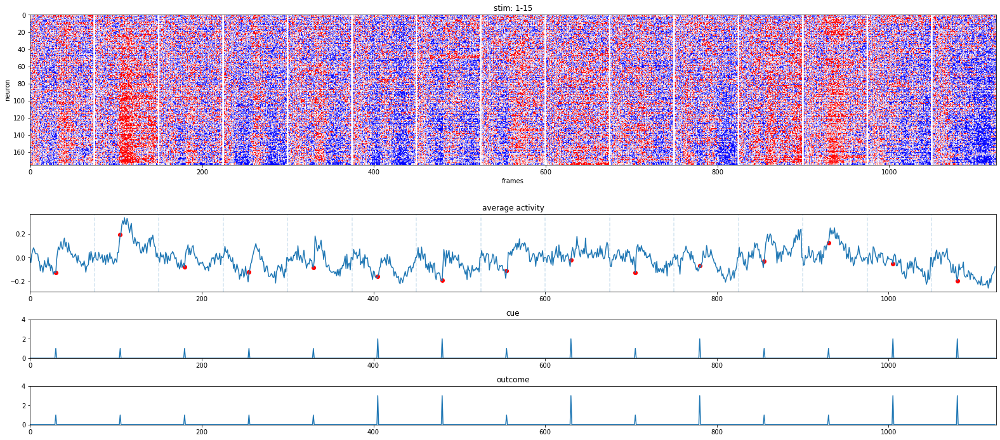

In [209]:
istart = 0
iend = 15
irange = np.arange(istart, iend)
isort = np.argsort(corr)
resp = daily_responses[irange].transpose(1, 0, 2)
resp = resp.reshape(NN, -1)
resp = resp[isort]
NT = resp.shape[-1]
cue = np.zeros(NT)
out = np.zeros(NT)
for k, v in enumerate(irange):
    cue[30+75*k] = daily_cues[v]
    out[30+75*k] = daily_outcomes[v]
    resp[:, (75*k-1):(75*k+1)] = 0
f, (a0, a1, a2, a3) = plt.subplots(4, 1, gridspec_kw={'height_ratios': [5, 2, 1, 1]}, figsize=(22,10))
im1 = a0.imshow(resp, vmin=-0.5, vmax=0.5, cmap='bwr') # magma
a0.set_xlabel('frames')
a0.set_ylabel('neuron')
x = np.arange(NT)
y = resp.mean(axis=0)
a1.plot(x, y)
idx = np.where(cue > 0)[0]
a1.scatter(x[idx], y[idx], c='red')
for k, v in enumerate(irange):
    a1.axvline(75*k, alpha=0.2, linestyle='--')
a1.set_xlim([tmin, tmax])
a1.set_title('average activity')
tmin = 0
tmax = NT
a2.plot(np.arange(NT), cue)
a2.set_xlim([tmin, tmax])
a2.set_ylim([0, 4])
a2.set_title('cue')
a3.plot(np.arange(NT), out)
a3.set_xlim([tmin, tmax])
a3.set_title('outcome')
a3.set_ylim([0, 4])
a0.set_title('stim: {}-{}'.format(istart+1, iend))
plt.tight_layout()
plt.show()

### response in different condition

In [215]:
print(daily_responses.shape, daily_cues.shape, daily_outcomes.shape)

(300, 175, 75) (300,) (300,)


In [229]:
iHit = np.where(daily_outcomes == 1)[0]
iMiss = np.where(daily_outcomes == 2)[0]
iFA = np.where(daily_outcomes == 3)[0]
iCR = np.where(daily_outcomes == 4)[0]
outcome_list = ['Hit', 'Miss', 'FA', 'CR']

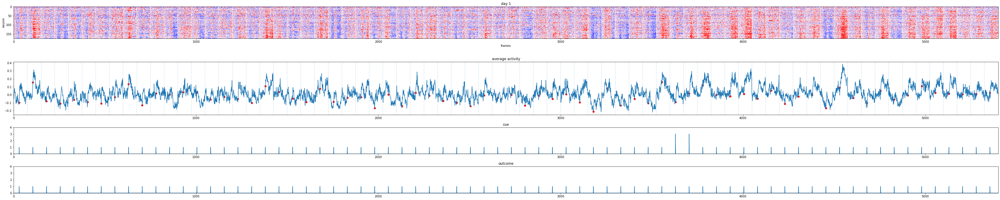

In [230]:
isort = np.argsort(corr)
outcome_index = 1
# hit responses
ioutcome = iHit
resp = daily_responses[ioutcome]
resp = resp.transpose(1, 0, 2)
resp = resp.reshape(NN, -1)
resp = resp[isort]
NT = resp.shape[-1]
cue = np.zeros(NT)
out = np.zeros(NT)
for k, v in enumerate(ioutcome):
    cue[30+75*k] = daily_cues[v]
    out[30+75*k] = daily_outcomes[v]
    resp[:, (75*k-1):(75*k+1)] = 0
f, (a0, a1, a2, a3) = plt.subplots(4, 1, gridspec_kw={'height_ratios': [2, 2, 1, 1]}, figsize=(int(len(ioutcome)*10/15),10))
im1 = a0.imshow(resp, vmin=-0.5, vmax=0.5, cmap='bwr') # magma
a0.set_xlabel('frames')
a0.set_ylabel('neuron')
x = np.arange(NT)
y = resp.mean(axis=0)
a1.plot(x, y)
idx = np.where(cue > 0)[0]
a1.scatter(x[idx], y[idx], c='red')
for k, v in enumerate(ioutcome):
    a1.axvline(75*k, alpha=0.2, linestyle='--')
a1.set_xlim([tmin, tmax])
a1.set_title('average activity')
tmin = 0
tmax = NT
a2.plot(np.arange(NT), cue)
a2.set_xlim([tmin, tmax])
a2.set_ylim([0, 4])
a2.set_title('cue')
a3.plot(np.arange(NT), out)
a3.set_xlim([tmin, tmax])
a3.set_title('outcome')
a3.set_ylim([0, 4])
a0.set_title('day {}'.format(day))
plt.tight_layout()
fig_save_path = os.path.join('figures', 'stim-evoke-response_{}_day-{}_{}'.format(mouse_name, day, outcome_list[outcome_index-1]))
plt.savefig(fig_save_path)
# plt.close()
plt.show()

In [234]:
dtypes = [('day', 'O'), ('block', 'O'), ('imagingfilename', 'O'), ('behaviorfilename', 'O'), ('nbaxonsperplane', 'O'), ('imagingdata', 'O'), ('MeanImg', 'O'), ('ycoord', 'O'), ('xcoord', 'O'), ('behavdata', 'O')]
dnames = []
for i in range(10):
    dnames.append(dtypes[i][0])
print(dnames)

['day', 'block', 'imagingfilename', 'behaviorfilename', 'nbaxonsperplane', 'imagingdata', 'MeanImg', 'ycoord', 'xcoord', 'behavdata']


# save all figures(for each outcome)

In [9]:
from utils import daily_blocks, block_stim_evoke_response
day = 1
for day in range(1, 16):
    iblocks = daily_blocks(data, day)
    if len(iblocks)>0:
        daily_cues = []
        daily_outcomes = []
        daily_responses = []
        daily_firstlicks = []
        daily_alllicks = []
        for i in iblocks:
            block = data[0, i]
            # normalize doesn't have much effect on the result, so set it to False
            cues, outcomes, firstlicks, stim_resp, alllicks = block_stim_evoke_response(block, normalize=False)
            daily_cues.append(cues)
            daily_outcomes.append(outcomes)
            daily_responses.append(stim_resp)
            daily_firstlicks.append(firstlicks)
            daily_alllicks.append(alllicks)

        daily_cues = np.hstack(daily_cues)
        daily_outcomes = np.hstack(daily_outcomes)
        daily_responses = np.vstack(daily_responses)
        daily_firstlicks = np.hstack(daily_firstlicks)
        daily_alllicks = np.vstack(daily_alllicks)

        print('day {} spk shape: {}'.format(day, daily_responses.shape))
        print('day {} behavior shape: {}'.format(day, daily_outcomes.shape))
        print('day {} alllick shape: {}'.format(day, daily_alllicks.shape))
        
        NN = daily_responses.shape[1]
        
        # from scipy.stats import pearsonr
        daily_spks = daily_responses.transpose(1, 0, 2)
        daily_spks = daily_spks.reshape(NN, -1)
        avg_resp = np.mean(daily_spks, axis=0) # ntrials x 75
        corr = np.zeros(NN)
        for i in range(NN):
            corr[i] = pearsonr(avg_resp, daily_spks[i])[0]
        isort = np.argsort(corr)
        
        outcome_index = 1
        for outcome_index in range(1,5):
            ioutcome = np.where(daily_outcomes == outcome_index)[0]
            resp = daily_responses[ioutcome]
            lick = daily_alllicks[ioutcome].reshape(-1)
            resp = resp.transpose(1, 0, 2)
            resp = resp.reshape(NN, -1)
            resp = resp[isort]
            NT = resp.shape[-1]
            cue = np.zeros(NT)
            out = np.zeros(NT)
            flick = np.zeros(NT)
            for k, v in enumerate(ioutcome):
                cue[30+75*k] = daily_cues[v]
                out[30+75*k] = daily_outcomes[v]
                if daily_firstlicks[k] >= 0:
                    flick[75*k + int(daily_firstlicks[v])] = 1
                resp[:, (75*k-1):(75*k+1)] = 0
            figw = max(int(len(ioutcome)*10/15), 20)
            f, (a0, a1, a2, a3, a4) = plt.subplots(5, 1, gridspec_kw={'height_ratios': [2, 1, 2, 1, 1]}, figsize=(figw,10))
            f.set_facecolor("white")
            im1 = a0.imshow(resp, vmin=-0.5, vmax=0.5, cmap='bwr') # magma
            a0.set_xlabel('frames')
            a0.set_ylabel('neuron')
            x = np.arange(NT)
            y = resp.mean(axis=0)
            tmin = 0
            tmax = NT
            a1.plot(x, lick, label='all lick')
            a1.set_xlim([tmin, tmax])
            a1.plot(x, flick, label='first lick')
            a1.legend(loc=1)
            a2.plot(x, y)
            idx = np.where(cue > 0)[0]
            a2.scatter(x[idx], y[idx], c='red', label='cue onset')
            a2.legend(loc=1)
            idx = np.where(flick>0)
            # a2.scatter(x[idx], y[idx], c='orange', label='first lick')
            a2.legend(loc=1)
            for k, v in enumerate(ioutcome):
                a1.axvline(75*k, alpha=0.2, linestyle='--')
            a2.set_xlim([tmin, tmax])
            a2.set_title('average activity')
            a3.plot(np.arange(NT), cue)
            a3.set_xlim([tmin, tmax])
            a3.set_ylim([0, 4])
            a3.set_title('cue')
            a4.plot(np.arange(NT), out)
            a4.set_xlim([tmin, tmax])
            a4.set_title('outcome')
            a4.set_ylim([0, 4])
            a0.set_title('day {}'.format(day))
#             a4.plot(np.arange(NT), flick)
#             a4.set_xlim([tmin, tmax])
#             a4.set_title('first lick')
            plt.tight_layout()
            fig_save_path = os.path.join('figures', 'stim-evoke-response_{}_day-{}_{}'.format(mouse_name, day, outcome_list[outcome_index-1]))
            plt.savefig(fig_save_path)
            plt.close()

day 1 spk shape: (300, 175, 75)
day 1 behavior shape: (300,)
day 1 alllick shape: (300, 75)
day 2 spk shape: (300, 141, 75)
day 2 behavior shape: (300,)
day 2 alllick shape: (300, 75)
day 3 spk shape: (300, 205, 75)
day 3 behavior shape: (300,)
day 3 alllick shape: (300, 75)
day 4 spk shape: (200, 139, 75)
day 4 behavior shape: (200,)
day 4 alllick shape: (200, 75)
day 5 spk shape: (200, 158, 75)
day 5 behavior shape: (200,)
day 5 alllick shape: (200, 75)
day 6 spk shape: (300, 169, 75)
day 6 behavior shape: (300,)
day 6 alllick shape: (300, 75)
day 7 spk shape: (200, 171, 75)
day 7 behavior shape: (200,)
day 7 alllick shape: (200, 75)
day 8 spk shape: (200, 187, 75)
day 8 behavior shape: (200,)
day 8 alllick shape: (200, 75)
day 9 spk shape: (300, 198, 75)
day 9 behavior shape: (300,)
day 9 alllick shape: (300, 75)
day 15 spk shape: (300, 180, 75)
day 15 behavior shape: (300,)
day 15 alllick shape: (300, 75)


# average response(per day)

In [134]:
day = 7
iblocks = daily_blocks(data, day)
if len(iblocks)>0:
    daily_cues = []
    daily_outcomes = []
    daily_responses = []
    daily_firstlicks = []
    daily_alllicks = []
    for i in iblocks:
        block = data[0, i]
        # normalize doesn't have much effect on the result, so set it to False
        cues, outcomes, firstlicks, stim_resp, alllicks = block_stim_evoke_response(block, normalize=False)
        daily_cues.append(cues)
        daily_outcomes.append(outcomes)
        daily_responses.append(stim_resp)
        daily_firstlicks.append(firstlicks)
        daily_alllicks.append(alllicks)

    daily_cues = np.hstack(daily_cues)
    daily_outcomes = np.hstack(daily_outcomes)
    daily_responses = np.vstack(daily_responses)
    daily_firstlicks = np.hstack(daily_firstlicks)
    daily_alllicks = np.vstack(daily_alllicks)

    print('day {} spk shape: {}'.format(day, daily_responses.shape))
    print('day {} behavior shape: {}'.format(day, daily_outcomes.shape))
    print('day {} alllick shape: {}'.format(day, daily_alllicks.shape))

day 7 spk shape: (200, 171, 75)
day 7 behavior shape: (200,)
day 7 alllick shape: (200, 75)


In [99]:
day = 1
for day in range(1, 16):
    iblocks = daily_blocks(data, day)
    plt.figure(figsize=(20, 10))
    if len(iblocks)>0:
        daily_cues = []
        daily_outcomes = []
        daily_responses = []
        daily_firstlicks = []
        daily_alllicks = []
        for i in iblocks:
            block = data[0, i]
            # normalize doesn't have much effect on the result, so set it to False
            cues, outcomes, firstlicks, stim_resp, alllicks = block_stim_evoke_response(block, normalize=False)
            daily_cues.append(cues)
            daily_outcomes.append(outcomes)
            daily_responses.append(stim_resp)
            daily_firstlicks.append(firstlicks)
            daily_alllicks.append(alllicks)

        daily_cues = np.hstack(daily_cues)
        daily_outcomes = np.hstack(daily_outcomes)
        daily_responses = np.vstack(daily_responses)
        daily_firstlicks = np.hstack(daily_firstlicks)
        daily_alllicks = np.vstack(daily_alllicks)

        print('day {} spk shape: {}'.format(day, daily_responses.shape))
        print('day {} behavior shape: {}'.format(day, daily_outcomes.shape))
        print('day {} alllick shape: {}'.format(day, daily_alllicks.shape))

        NN = daily_responses.shape[1]

        # from scipy.stats import pearsonr
        daily_spks = daily_responses.transpose(1, 0, 2)
        daily_spks = daily_spks.reshape(NN, -1)
        avg_resp = np.mean(daily_spks, axis=0) # ntrials x 75
        corr = np.zeros(NN)
        for i in range(NN):
            corr[i] = pearsonr(avg_resp, daily_spks[i])[0]
        isort = np.argsort(corr)
        for outcome_index in range(1,5):
            # hit responses
            ioutcome = np.where(daily_outcomes == outcome_index)[0]
            resp = daily_responses[ioutcome]
            lick = daily_alllicks[ioutcome]
            cue = daily_cues[i]
            NT = resp.shape[-1]
            resp = resp.reshape(-1, NT)
            resp = np.mean(resp, axis=0)
            flick = np.zeros(NT)
            plt.subplot(2,4,outcome_index)
            x = np.arange(NT)
            plt.plot(x, resp)
            plt.title(outcome_list[outcome_index-1])
            plt.ylabel('df/f')
            plt.subplot(2,4,4+outcome_index)
            plt.imshow(lick, cmap='binary')
            plt.xlabel('frame')
            plt.ylabel('trial')
        plt.suptitle('day {}'.format(day))
        fig_save_path = os.path.join('figures', 'avg_stim-evoke-response_{}_day-{}'.format(mouse_name, day))
        plt.savefig(fig_save_path)
        plt.close()

day 1 spk shape: (300, 175, 75)
day 1 behavior shape: (300,)
day 1 alllick shape: (300,)
day 2 spk shape: (300, 141, 75)
day 2 behavior shape: (300,)
day 2 alllick shape: (300,)
day 3 spk shape: (300, 205, 75)
day 3 behavior shape: (300,)
day 3 alllick shape: (300,)
day 4 spk shape: (200, 139, 75)
day 4 behavior shape: (200,)
day 4 alllick shape: (200,)
day 5 spk shape: (200, 158, 75)
day 5 behavior shape: (200,)
day 5 alllick shape: (200,)
day 6 spk shape: (300, 169, 75)
day 6 behavior shape: (300,)
day 6 alllick shape: (300,)
day 7 spk shape: (200, 171, 75)
day 7 behavior shape: (200,)
day 7 alllick shape: (200,)
day 8 spk shape: (200, 187, 75)
day 8 behavior shape: (200,)
day 8 alllick shape: (200,)
day 9 spk shape: (300, 198, 75)
day 9 behavior shape: (300,)
day 9 alllick shape: (300,)
day 15 spk shape: (300, 180, 75)
day 15 behavior shape: (300,)
day 15 alllick shape: (300,)


<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

# average response (per outcome)

In [11]:
n_valid_days = 0
for day in range(1, 16):
    iblocks = daily_blocks(data, day)
    if len(iblocks)>0:
        n_valid_days += 1

In [77]:
a = np.arange(3).reshape(3, 1)
b = np.repeat(a, 3, axis=1)
print(b)

[[0 0 0]
 [1 1 1]
 [2 2 2]]


In [86]:
# per outcome
day = 1
for outcome_index in range(1,5):
    iday = 0
    f, axs = plt.subplots(2, n_valid_days, gridspec_kw={'width_ratios': np.ones(n_valid_days)}, figsize=(5*n_valid_days, 5))
    for day in range(1, nDays+1):
        iblocks = daily_blocks(data, day)
        if len(iblocks)>0:
            iday += 1
            daily_cues = []
            daily_outcomes = []
            daily_responses = []
            daily_firstlicks = []
            daily_alllicks = []
            daily_nblock = []
            for i in iblocks:
                block = data[0, i]
                # normalize doesn't have much effect on the result, so set it to False
                cues, outcomes, firstlicks, stim_resp, alllicks = block_stim_evoke_response(block, normalize=False)
                daily_cues.append(cues)
                daily_outcomes.append(outcomes)
                daily_responses.append(stim_resp)
                daily_firstlicks.append(firstlicks)
                daily_alllicks.append(alllicks)
                daily_nblock.append(block['block'][0][0] * np.ones(len(cues)))

            daily_cues = np.hstack(daily_cues)
            daily_outcomes = np.hstack(daily_outcomes)
            daily_responses = np.vstack(daily_responses)
            daily_firstlicks = np.hstack(daily_firstlicks)
            daily_alllicks = np.vstack(daily_alllicks)
            daily_nblock = np.hstack(daily_nblock)

            print('day {} spk shape: {}'.format(day, daily_responses.shape))
            print('day {} behavior shape: {}'.format(day, daily_outcomes.shape))
            print('day {} alllick shape: {}'.format(day, daily_alllicks.shape))
            print('day {} block shape: {}'.format(day, daily_nblock.shape))

            NN = daily_responses.shape[1]

            # from scipy.stats import pearsonr
            daily_spks = daily_responses.transpose(1, 0, 2)
            daily_spks = daily_spks.reshape(NN, -1)
            avg_resp = np.mean(daily_spks, axis=0) # ntrials x 75
            corr = np.zeros(NN)
            for i in range(NN):
                corr[i] = pearsonr(avg_resp, daily_spks[i])[0]
            isort = np.argsort(corr)

            # hit responses
            ioutcome = np.where(daily_outcomes == outcome_index)[0]
            resp = daily_responses[ioutcome]
            lick = daily_alllicks[ioutcome]
            nblock = daily_nblock[ioutcome].reshape(-1, 1)
            nblock = np.repeat(nblock, lick.shape[-1], axis=1)
            cue = daily_cues[i]
            NT = resp.shape[-1]
            resp = resp.reshape(-1, NT)
            resp = np.mean(resp, axis=0)
            # plt.subplot(2, n_valid_days, iday)
            x = np.arange(NT)
            axs[0, iday-1].plot(x, resp)
            axs[0, iday-1].set_title('day {}, {}'.format(day, outcome_list[outcome_index-1]))
            axs[0, iday-1].set_ylabel('df/f')
            axs[0, iday-1].set_xlim([0, 75])
            axs[0, iday-1].set_ylim([-0.03, 0.1])
            # plt.subplot(2, n_valid_days, iday+n_valid_days)
            axs[1, iday-1].imshow(lick*nblock, cmap='Greys', aspect="auto", vmin=0, vmax=3)
            axs[1, iday-1].set_xlabel('frame')
            axs[1, iday-1].set_ylabel('trial')
            axs[1, iday-1].set_xlim([0, 75])
    fig_save_path = os.path.join('figures', mouse_name, 'avg_stim-evoke-response', 'avg_stim-evoke-response_{}_{}'.format(mouse_name, outcome_list[outcome_index-1]))
    plt.savefig(fig_save_path)
    plt.close()

day 1 spk shape: (300, 175, 75)
day 1 behavior shape: (300,)
day 1 alllick shape: (300, 75)
day 1 block shape: (300,)
day 2 spk shape: (300, 141, 75)
day 2 behavior shape: (300,)
day 2 alllick shape: (300, 75)
day 2 block shape: (300,)
day 3 spk shape: (300, 205, 75)
day 3 behavior shape: (300,)
day 3 alllick shape: (300, 75)
day 3 block shape: (300,)
day 4 spk shape: (200, 139, 75)
day 4 behavior shape: (200,)
day 4 alllick shape: (200, 75)
day 4 block shape: (200,)
day 5 spk shape: (200, 158, 75)
day 5 behavior shape: (200,)
day 5 alllick shape: (200, 75)
day 5 block shape: (200,)
day 6 spk shape: (300, 169, 75)
day 6 behavior shape: (300,)
day 6 alllick shape: (300, 75)
day 6 block shape: (300,)
day 7 spk shape: (200, 171, 75)
day 7 behavior shape: (200,)
day 7 alllick shape: (200, 75)
day 7 block shape: (200,)
day 8 spk shape: (200, 187, 75)
day 8 behavior shape: (200,)
day 8 alllick shape: (200, 75)
day 8 block shape: (200,)
day 9 spk shape: (300, 198, 75)
day 9 behavior shape: (3

# average response (PB or RL)

In [88]:
# per outcome
day = 1
for outcome_index in range(1,5):
    iday = 0
    f, axs = plt.subplots(2, n_valid_days, gridspec_kw={'width_ratios': np.ones(n_valid_days)}, figsize=(5*n_valid_days, 5))
    for day in range(1, nDays+1):
        iblocks = daily_blocks(data, day)
        if len(iblocks)>0:
            iday += 1
            daily_cues = []
            daily_outcomes = []
            daily_responses = []
            daily_firstlicks = []
            daily_alllicks = []
            for i in iblocks:
                block = data[0, i]
                # normalize doesn't have much effect on the result, so set it to False
                cues, outcomes, firstlicks, stim_resp, alllicks = block_stim_evoke_response(block, normalize=False)
                daily_cues.append(cues)
                daily_outcomes.append(outcomes)
                daily_responses.append(stim_resp)
                daily_firstlicks.append(firstlicks)
                daily_alllicks.append(alllicks)

            daily_cues = np.hstack(daily_cues)
            daily_outcomes = np.hstack(daily_outcomes)
            daily_responses = np.vstack(daily_responses)
            daily_firstlicks = np.hstack(daily_firstlicks)
            daily_alllicks = np.vstack(daily_alllicks)

            print('day {} spk shape: {}'.format(day, daily_responses.shape))
            print('day {} behavior shape: {}'.format(day, daily_outcomes.shape))
            print('day {} alllick shape: {}'.format(day, daily_outcomes.shape))

            NN = daily_responses.shape[1]

            # from scipy.stats import pearsonr
            daily_spks = daily_responses.transpose(1, 0, 2)
            daily_spks = daily_spks.reshape(NN, -1)
            avg_resp = np.mean(daily_spks, axis=0) # ntrials x 75
            corr = np.zeros(NN)
            for i in range(NN):
                corr[i] = pearsonr(avg_resp, daily_spks[i])[0]
            # hit responses
            ioutcome = np.where(daily_outcomes == outcome_index)[0]
            iRL = np.where(daily_cues < 3)[0]
            iPB = np.where(daily_cues > 2)[0]
            iRL = np.intersect1d(ioutcome, iRL)
            iPB = np.intersect1d(ioutcome, iPB)
            rl_resp = daily_responses[iRL]
            NT = rl_resp.shape[-1]
            rl_resp = rl_resp.reshape(-1, NT)
            rl_resp = np.mean(rl_resp, axis=0)
            
            pb_resp = daily_responses[iPB]
            pb_resp = pb_resp.reshape(-1, NT)
            pb_resp = np.mean(pb_resp, axis=0)
            
            rl_lick = daily_alllicks[iRL]
            pb_lick = -1.0 * daily_alllicks[iPB]
            lick = np.vstack([rl_lick, pb_lick])
            # print(lick.shape, lick.min(), lick.max())
            # plt.subplot(2, n_valid_days, iday)
            x = np.arange(NT)
            axs[0, iday-1].plot(x, rl_resp, color='red', label='RL')
            axs[0, iday-1].plot(x, pb_resp, color='blue', label='PB')
            axs[0, iday-1].set_title('day {}, {}'.format(day, outcome_list[outcome_index-1]))
            axs[0, iday-1].set_ylabel('df/f')
            axs[0, iday-1].set_xlim([0, 75])
            axs[0, iday-1].set_ylim([-0.03, 0.1])
            axs[0, iday-1].legend(loc=1)
            # plt.subplot(2, n_valid_days, iday+n_valid_days)
            axs[1, iday-1].imshow(lick, cmap='bwr', aspect="auto", vmin=-1, vmax=1)
            axs[1, iday-1].set_xlabel('frame')
            axs[1, iday-1].set_ylabel('trial')
            axs[1, iday-1].set_xlim([0, 75])
    fig_save_path = os.path.join('figures', mouse_name, 'avg_stim-evoke-response', 'avg_stim-evoke-response_RLPB_{}_{}'.format(mouse_name, outcome_list[outcome_index-1]))
    plt.savefig(fig_save_path)
    plt.close()

day 1 spk shape: (300, 175, 75)
day 1 behavior shape: (300,)
day 1 alllick shape: (300,)
day 2 spk shape: (300, 141, 75)
day 2 behavior shape: (300,)
day 2 alllick shape: (300,)
day 3 spk shape: (300, 205, 75)
day 3 behavior shape: (300,)
day 3 alllick shape: (300,)
day 4 spk shape: (200, 139, 75)
day 4 behavior shape: (200,)
day 4 alllick shape: (200,)
day 5 spk shape: (200, 158, 75)
day 5 behavior shape: (200,)
day 5 alllick shape: (200,)
day 6 spk shape: (300, 169, 75)
day 6 behavior shape: (300,)
day 6 alllick shape: (300,)
day 7 spk shape: (200, 171, 75)
day 7 behavior shape: (200,)
day 7 alllick shape: (200,)
day 8 spk shape: (200, 187, 75)
day 8 behavior shape: (200,)
day 8 alllick shape: (200,)
day 9 spk shape: (300, 198, 75)
day 9 behavior shape: (300,)
day 9 alllick shape: (300,)
day 15 spk shape: (300, 180, 75)
day 15 behavior shape: (300,)
day 15 alllick shape: (300,)
day 1 spk shape: (300, 175, 75)
day 1 behavior shape: (300,)
day 1 alllick shape: (300,)
day 2 spk shape: (

e:\kishorelab\env\fengtong\lib\site-packages\numpy\core\fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
e:\kishorelab\env\fengtong\lib\site-packages\numpy\core\_methods.py:180: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(


day 6 spk shape: (300, 169, 75)
day 6 behavior shape: (300,)
day 6 alllick shape: (300,)
day 7 spk shape: (200, 171, 75)
day 7 behavior shape: (200,)
day 7 alllick shape: (200,)
day 8 spk shape: (200, 187, 75)
day 8 behavior shape: (200,)
day 8 alllick shape: (200,)
day 9 spk shape: (300, 198, 75)
day 9 behavior shape: (300,)
day 9 alllick shape: (300,)
day 15 spk shape: (300, 180, 75)
day 15 behavior shape: (300,)
day 15 alllick shape: (300,)


e:\kishorelab\env\fengtong\lib\site-packages\numpy\core\fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
e:\kishorelab\env\fengtong\lib\site-packages\numpy\core\_methods.py:180: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(


day 1 spk shape: (300, 175, 75)
day 1 behavior shape: (300,)
day 1 alllick shape: (300,)
day 2 spk shape: (300, 141, 75)
day 2 behavior shape: (300,)
day 2 alllick shape: (300,)
day 3 spk shape: (300, 205, 75)
day 3 behavior shape: (300,)
day 3 alllick shape: (300,)
day 4 spk shape: (200, 139, 75)
day 4 behavior shape: (200,)
day 4 alllick shape: (200,)
day 5 spk shape: (200, 158, 75)
day 5 behavior shape: (200,)
day 5 alllick shape: (200,)
day 6 spk shape: (300, 169, 75)
day 6 behavior shape: (300,)
day 6 alllick shape: (300,)
day 7 spk shape: (200, 171, 75)
day 7 behavior shape: (200,)
day 7 alllick shape: (200,)
day 8 spk shape: (200, 187, 75)
day 8 behavior shape: (200,)
day 8 alllick shape: (200,)


e:\kishorelab\env\fengtong\lib\site-packages\numpy\core\fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
e:\kishorelab\env\fengtong\lib\site-packages\numpy\core\_methods.py:180: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(
e:\kishorelab\env\fengtong\lib\site-packages\numpy\core\fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
e:\kishorelab\env\fengtong\lib\site-packages\numpy\core\_methods.py:180: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(


day 9 spk shape: (300, 198, 75)
day 9 behavior shape: (300,)
day 9 alllick shape: (300,)
day 15 spk shape: (300, 180, 75)
day 15 behavior shape: (300,)
day 15 alllick shape: (300,)
day 1 spk shape: (300, 175, 75)
day 1 behavior shape: (300,)
day 1 alllick shape: (300,)
day 2 spk shape: (300, 141, 75)
day 2 behavior shape: (300,)
day 2 alllick shape: (300,)
day 3 spk shape: (300, 205, 75)
day 3 behavior shape: (300,)
day 3 alllick shape: (300,)
day 4 spk shape: (200, 139, 75)
day 4 behavior shape: (200,)
day 4 alllick shape: (200,)
day 5 spk shape: (200, 158, 75)
day 5 behavior shape: (200,)
day 5 alllick shape: (200,)
day 6 spk shape: (300, 169, 75)
day 6 behavior shape: (300,)
day 6 alllick shape: (300,)
day 7 spk shape: (200, 171, 75)
day 7 behavior shape: (200,)
day 7 alllick shape: (200,)
day 8 spk shape: (200, 187, 75)
day 8 behavior shape: (200,)
day 8 alllick shape: (200,)
day 9 spk shape: (300, 198, 75)
day 9 behavior shape: (300,)
day 9 alllick shape: (300,)
day 15 spk shape: 

# load lick data

In [3]:
from utils import daily_blocks, block_stim_evoke_response
day = 7
iblocks = daily_blocks(data, day)

In [4]:
from utils import extract_all_licks
block = data[0, iblocks[-1]]
behavior, firstlickframes, raw_alllickframes = extract_all_licks(block)

processing jl009_7v2 ...
number of frames in total: 19679.0
number of frames in total(2 plane): 9839
number of frames in structure: 9840
total number of licks:  204
number of tones:  26
mismatch frames:
0 521 521 1.0 1 10
1 606 606 1.0 11 25
2 709 709 1.0 26 65
3 996 996 1.0 66 79
4 1179 1179 1.0 80 88
5 1263 1263 1.0 89 91
6 1393 1393 1.0 92 96
7 1499 1499 1.0 97 110
8 1738 1738 1.0 111 117
9 1912 1912 1.0 118 130
10 1995 1995 1.0 131 142
11 2080 2080 1.0 143 152
12 2164 2164 1.0 153 159
13 2251 2251 1.0 160 161
14 2638 2638 1.0 162 164
15 2723 2723 1.0 165 166
16 2808 2808 1.0 167 168
17 3431 3431 1.0 169 171
18 3515 3515 1.0 172 174
19 3780 3780 1.0 175 175
20 4135 4135 1.0 176 178
21 4478 4478 1.0 179 182
22 5103 5103 1.0 183 189
23 5552 5552 1.0 190 195
24 5638 5638 1.0 196 202
25 7524 7524 1.0 203 -1
jl009_7v2 finished!



In [150]:
behav = block['behavdata']

In [151]:
print(behav.shape)

(4, 9840)


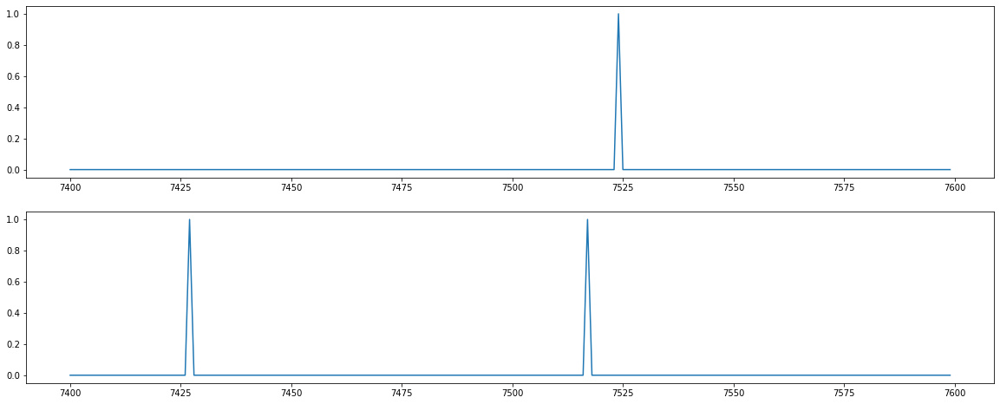

In [159]:
plt.figure(figsize=(20, 8))
x = np.arange(behav.shape[-1])
x = np.arange(7400,7600)
plt.subplot(211)
plt.plot(x, behav[2][x])
plt.subplot(212)
plt.plot(x, behav[0][x])

In [148]:
alllicks = np.zeros(behavior.shape[1])
raw_alllickframes = raw_alllickframes.astype('int')
alllicks[raw_alllickframes] = 1

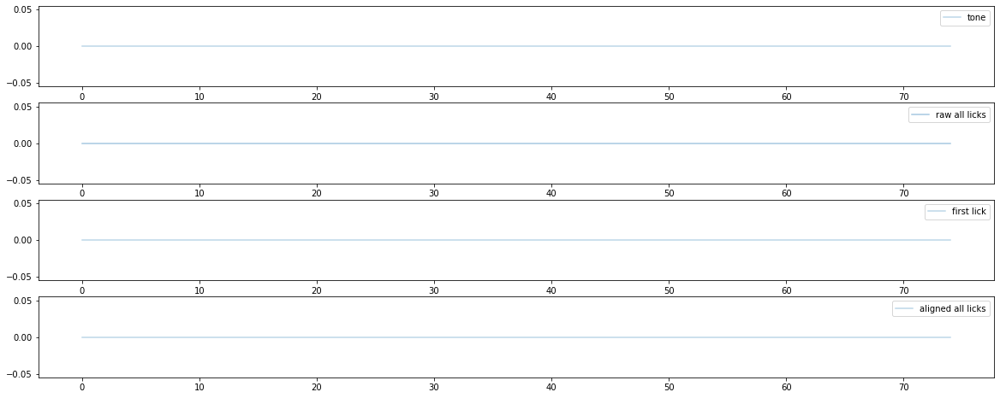

In [149]:
# x = np.arange(behavior.shape[1])
# x = np.arange(2000, 4000)
plt.figure(figsize=(20, 8))
plt.subplot(411)
plt.plot(x, behavior[0][x], alpha=0.3, label='tone')
plt.legend(loc=1)
plt.subplot(412)
# plt.plot(x, behavior[1][x], alpha=0.3, label='2')
plt.plot(x, alllicks[x], alpha=0.4, label='raw all licks')
plt.legend(loc=1)
plt.subplot(413)
plt.plot(x, behavior[2][x], alpha=0.3, label='first lick')
plt.legend(loc=1)
plt.subplot(414)
plt.plot(x, behavior[3][x], alpha=0.3, label='aligned all licks')
plt.legend(loc=1)
# plt.legend()
plt.show()

# area under curve

In [52]:
nDays = data[0, -1]['day'][0][0]

start


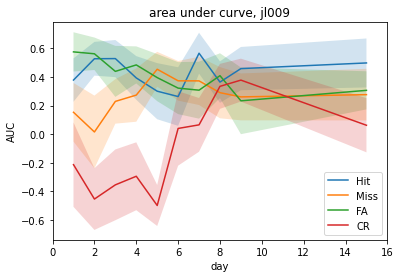

In [70]:
day = 1
print('start')
for outcome_index in range(1,5):
    iday = 0
    areas = []
    days = []
    bandwidth = []
    # f, axs = plt.subplots(2, n_valid_days, gridspec_kw={'width_ratios': np.ones(n_valid_days)}, figsize=(5*n_valid_days, 5))
    for day in range(1, 16):
        iblocks = daily_blocks(data, day)
        if len(iblocks)>0:
            iday += 1
            daily_cues = []
            daily_outcomes = []
            daily_responses = []
            daily_firstlicks = []
            daily_alllicks = []
            for i in iblocks:
                block = data[0, i]
                # normalize doesn't have much effect on the result, so set it to False
                cues, outcomes, firstlicks, stim_resp, alllicks = block_stim_evoke_response(block, normalize=False)
                daily_cues.append(cues)
                daily_outcomes.append(outcomes)
                daily_responses.append(stim_resp)
                daily_firstlicks.append(firstlicks)
                daily_alllicks.append(alllicks)

            daily_cues = np.hstack(daily_cues)
            daily_outcomes = np.hstack(daily_outcomes)
            daily_responses = np.vstack(daily_responses)
            daily_firstlicks = np.hstack(daily_firstlicks)
            daily_alllicks = np.vstack(daily_alllicks)

            NN = daily_responses.shape[1]

            # from scipy.stats import pearsonr
            daily_spks = daily_responses.transpose(1, 0, 2)
            daily_spks = daily_spks.reshape(NN, -1)
            avg_resp = np.mean(daily_spks, axis=0) # ntrials x 75

            # hit responses
            ioutcome = np.where(daily_outcomes == outcome_index)[0]
            resp = daily_responses[ioutcome]
            NT = resp.shape[-1]
            resp = resp.reshape(-1, NT)
            resp = np.mean(resp, axis=0)
            area_under_curve = resp[30:] / np.max(np.abs(resp[30:]))
            std = np.std(area_under_curve)                     
            area_under_curve = np.mean(area_under_curve)
            days.append(day)
            areas.append(area_under_curve)
            bandwidth.append(std)
    bandwidth = np.array(bandwidth)
    plt.plot(days, areas, label=outcome_list[outcome_index-1])
    plt.fill_between(days, areas+bandwidth/2, areas-bandwidth/2, alpha=.2)
plt.legend()
plt.xlabel('day')
plt.ylabel('AUC')
plt.title('area under curve, {}'.format(mouse_name))
plt.xlim([0, nDays+1])
plt.show()
#     fig_save_path = os.path.join('figures', 'avg_stim-evoke-response_{}_{}'.format(mouse_name, outcome_list[outcome_index-1]))
#     plt.savefig(fig_save_path)
#     plt.close()

# lick duration

start


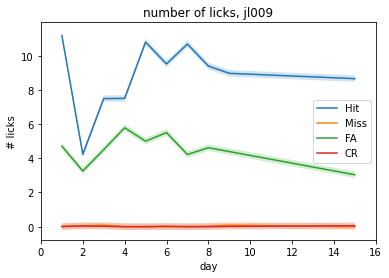

In [72]:
# per outcome
day = 1
print('start')
for outcome_index in range(1,5):
    iday = 0
    days = []
    nalllicks = []
    bandwidth = []
    # f, axs = plt.subplots(2, n_valid_days, gridspec_kw={'width_ratios': np.ones(n_valid_days)}, figsize=(5*n_valid_days, 5))
    for day in range(1, 16):
        iblocks = daily_blocks(data, day)
        if len(iblocks)>0:
            iday += 1
            daily_cues = []
            daily_outcomes = []
            daily_responses = []
            daily_firstlicks = []
            daily_alllicks = []
            for i in iblocks:
                block = data[0, i]
                # normalize doesn't have much effect on the result, so set it to False
                cues, outcomes, firstlicks, stim_resp, alllicks = block_stim_evoke_response(block, normalize=False)
                daily_cues.append(cues)
                daily_outcomes.append(outcomes)
                daily_responses.append(stim_resp)
                daily_firstlicks.append(firstlicks)
                daily_alllicks.append(alllicks)

            daily_cues = np.hstack(daily_cues)
            daily_outcomes = np.hstack(daily_outcomes)
            daily_responses = np.vstack(daily_responses)
            daily_firstlicks = np.hstack(daily_firstlicks)
            daily_alllicks = np.vstack(daily_alllicks)

            NN = daily_responses.shape[1]

            # from scipy.stats import pearsonr
            daily_spks = daily_responses.transpose(1, 0, 2)
            daily_spks = daily_spks.reshape(NN, -1)
            avg_resp = np.mean(daily_spks, axis=0) # ntrials x 75

            # hit responses
            ioutcome = np.where(daily_outcomes == outcome_index)[0]
            resp = daily_responses[ioutcome]
            lick = daily_alllicks[ioutcome]
            cue = daily_cues[i]
            NT = resp.shape[-1]
            resp = resp.reshape(-1, NT)
            resp = np.mean(resp, axis=0)
            # plt.subplot(2, n_valid_days, iday)
            x = np.arange(NT)
            nlicks = np.mean(np.sum(lick[:, 30:], axis=1))
            atd = np.std(np.sum(lick[:, 30:], axis=1))
            days.append(day)
            nalllicks.append(nlicks)
            bandwidth.append(std)
    bandwidth = np.array(bandwidth)
    plt.plot(days, nalllicks, label=outcome_list[outcome_index-1])
    plt.fill_between(days, nalllicks+bandwidth/2, nalllicks-bandwidth/2, alpha=.2)
plt.legend()
plt.xlabel('day')
plt.ylabel('# licks')
plt.title('number of licks, {}'.format(mouse_name))
plt.xlim([0, nDays+1])
plt.show()

# inhibition when withhold licking

start


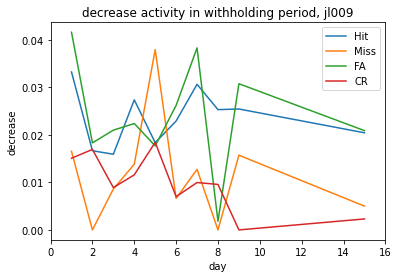

In [85]:
day = 1
print('start')
for outcome_index in range(1,5):
    iday = 0
    inhis = []
    days = []
    # f, axs = plt.subplots(2, n_valid_days, gridspec_kw={'width_ratios': np.ones(n_valid_days)}, figsize=(5*n_valid_days, 5))
    for day in range(1, nDays+1):
        iblocks = daily_blocks(data, day)
        if len(iblocks)>0:
            iday += 1
            daily_cues = []
            daily_outcomes = []
            daily_responses = []
            daily_firstlicks = []
            daily_alllicks = []
            for i in iblocks:
                block = data[0, i]
                # normalize doesn't have much effect on the result, so set it to False
                cues, outcomes, firstlicks, stim_resp, alllicks = block_stim_evoke_response(block, normalize=False)
                daily_cues.append(cues)
                daily_outcomes.append(outcomes)
                daily_responses.append(stim_resp)
                daily_firstlicks.append(firstlicks)
                daily_alllicks.append(alllicks)

            daily_cues = np.hstack(daily_cues)
            daily_outcomes = np.hstack(daily_outcomes)
            daily_responses = np.vstack(daily_responses)
            daily_firstlicks = np.hstack(daily_firstlicks)
            daily_alllicks = np.vstack(daily_alllicks)

            NN = daily_responses.shape[1]

            # hit responses
            ioutcome = np.where(daily_outcomes == outcome_index)[0]
            resp = daily_responses[ioutcome]
            NT = resp.shape[-1]
            resp = resp.reshape(-1, NT)
            resp = np.mean(resp, axis=0)
            min_idx = max(np.argmin(resp[10:30])+10, 11)
            inhi = resp[10:min_idx].max() - resp[10:30].min()
            days.append(day)
            inhis.append(inhi)
    plt.plot(days, inhis, label=outcome_list[outcome_index-1])
plt.legend()
plt.xlabel('day')
plt.ylabel('decrease')
plt.title('decrease activity in withholding period, {}'.format(mouse_name))
plt.xlim([0, nDays+1])
plt.show()

# max response

start


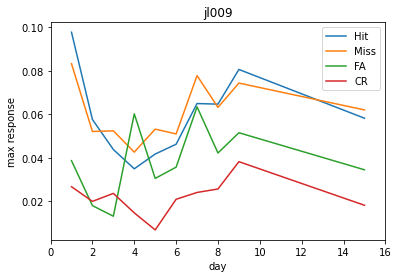

In [103]:
day = 1
print('start')
for outcome_index in range(1,5):
    iday = 0
    inhis = []
    days = []
    # f, axs = plt.subplots(2, n_valid_days, gridspec_kw={'width_ratios': np.ones(n_valid_days)}, figsize=(5*n_valid_days, 5))
    for day in range(1, nDays+1):
        iblocks = daily_blocks(data, day)
        if len(iblocks)>0:
            iday += 1
            daily_cues = []
            daily_outcomes = []
            daily_responses = []
            daily_firstlicks = []
            daily_alllicks = []
            for i in iblocks:
                block = data[0, i]
                # normalize doesn't have much effect on the result, so set it to False
                cues, outcomes, firstlicks, stim_resp, alllicks = block_stim_evoke_response(block, normalize=False)
                daily_cues.append(cues)
                daily_outcomes.append(outcomes)
                daily_responses.append(stim_resp)
                daily_firstlicks.append(firstlicks)
                daily_alllicks.append(alllicks)

            daily_cues = np.hstack(daily_cues)
            daily_outcomes = np.hstack(daily_outcomes)
            daily_responses = np.vstack(daily_responses)
            daily_firstlicks = np.hstack(daily_firstlicks)
            daily_alllicks = np.vstack(daily_alllicks)

            NN = daily_responses.shape[1]

            # hit responses
            ioutcome = np.where(daily_outcomes == outcome_index)[0]
            resp = daily_responses[ioutcome]
            NT = resp.shape[-1]
            resp = resp.reshape(-1, NT)
            resp = np.mean(resp, axis=0)
            inhi = np.max(resp)
            days.append(day)
            inhis.append(inhi)
    plt.plot(days, inhis, label=outcome_list[outcome_index-1])
plt.legend()
plt.xlabel('day')
plt.ylabel('max response')
plt.title('{}'.format(mouse_name))
plt.xlim([0, nDays+1])
plt.show()